In [2]:
using Plots, StatsPlots
using Plots.PlotMeasures
using JLD2
include("samplingUtilsNew.jl");
include("ForecastingMainNew.jl")

include("/Users/joshua/Desktop/QTNML_paper/QuantumInspiredML/LogLoss/encodings.jl");
include("/Users/joshua/Desktop/QTNML_paper/QuantumInspiredML/LogLoss/structs.jl");

In [2]:
verbosity = 0
function KLD_iter(BT_c::ITensor, LEP::PCacheCol, REP::PCacheCol,
    product_state::PState, lid::Int, rid::Int) 
    """Computes the complex valued logarithmic loss function derived from KL divergence and its gradient"""


    yhat, phi_tilde = yhat_phitilde(BT_c, LEP, REP, product_state, lid, rid)

    # convert the label to ITensor
    label_idx = first(inds(yhat))
    y = onehot(label_idx => (product_state.label + 1))
    f_ln = first(yhat *y)
    loss = -log(abs2(f_ln))

    # construct the gradient - return dC/dB
    gradient = -y * conj(phi_tilde / f_ln) # mult by y to account for delta_l^lambda



    return [loss, gradient]

end

KLD_iter (generic function with 1 method)

In [3]:
ds = collect(1:1:50);
num_evals = 1000;
xvals = collect(LinRange((-1.0), (1.0), num_evals));
errors_allx_fr = Matrix{Float64}(undef, length(ds), num_evals);
stds_allx_fr = Matrix{Float64}(undef, length(ds), num_evals);
for (i, d) in enumerate(ds)
    println("Computing d=$d")
    opts=Options(; nsweeps=10, chi_max=40, update_iters=1, verbosity=0, dtype=Complex{Float64}, lg_iter=KLD_iter,
    bbopt=BBOpt("CustomGD"), track_cost=false, eta=0.05, rescale = (false, true), d=d, aux_basis_dim=2, encoding=Basis("Fourier"));
    _, abs_diffs, stds = get_encoding_uncertainty(opts, xvals);
    errors_allx_fr[i, :] = abs_diffs
    stds_allx_fr[i, :] = stds
end

Computing d=1


MethodError: MethodError: no method matching Options(; nsweeps::Int64, chi_max::Int64, update_iters::Int64, verbosity::Int64, dtype::DataType, lg_iter::typeof(KLD_iter), bbopt::BBOpt, track_cost::Bool, eta::Float64, rescale::Tuple{Bool, Bool}, d::Int64, aux_basis_dim::Int64, encoding::Basis)

Closest candidates are:
  Options(!Matched::Options, !Matched::AbstractDict) got unsupported keyword arguments "nsweeps", "chi_max", "update_iters", "verbosity", "dtype", "lg_iter", "bbopt", "track_cost", "eta", "rescale", "d", "aux_basis_dim", "encoding"
   @ Main ~/.julia/packages/Parameters/MK0O4/src/Parameters.jl:572
  Options(!Matched::Options; kwargs...)
   @ Main ~/Desktop/QTNML_paper/QuantumInspiredML/LogLoss/structs.jl:107
  Options(!Matched::Options, !Matched::Tuple{Symbol, Any}...) got unsupported keyword arguments "nsweeps", "chi_max", "update_iters", "verbosity", "dtype", "lg_iter", "bbopt", "track_cost", "eta", "rescale", "d", "aux_basis_dim", "encoding"
   @ Main ~/.julia/packages/Parameters/MK0O4/src/Parameters.jl:573
  ...


In [120]:
yvals = ds;

In [112]:
custom_cmap = cgrad(:thermal, 80, categorical = true, scale=:exp)

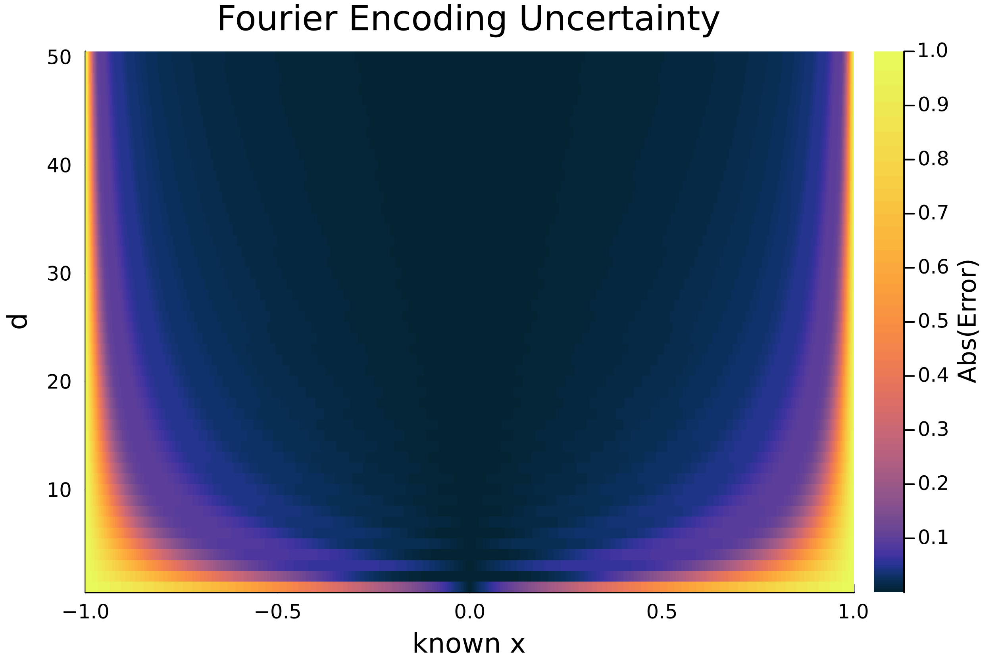

In [123]:
heatmap(xvals, yvals, errors_allx_fr, title="Fourier Encoding Uncertainty", 
    xlabel="known x", ylabel="d", colorbar_title="Abs(Error)", c=custom_cmap, dpi=420)
#savefig("fourier_encoding_uncertainty.png")

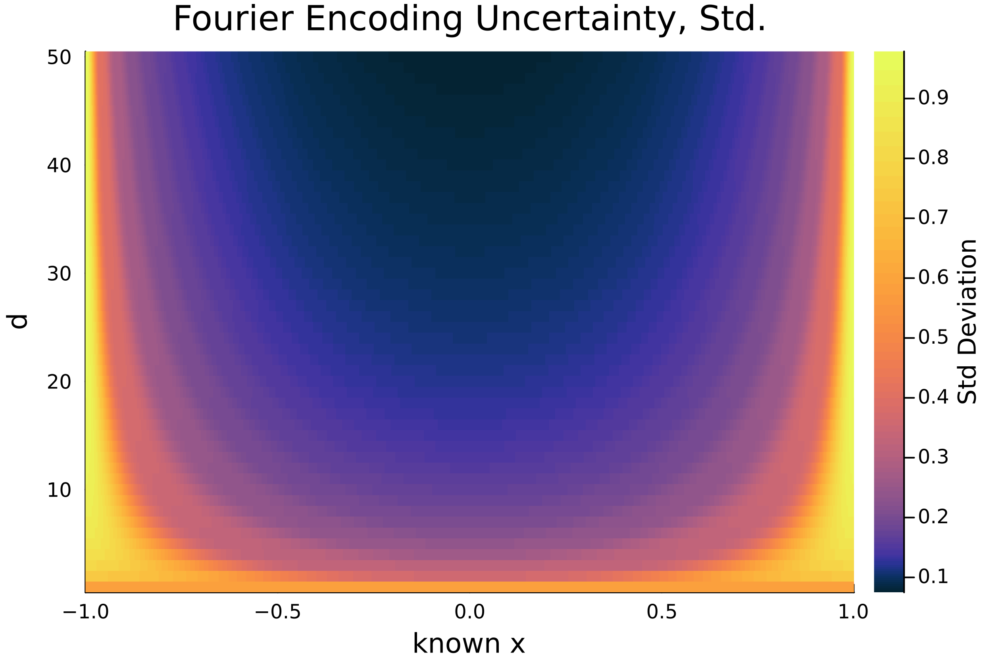

In [124]:
heatmap(xvals, yvals, stds_allx_fr, title="Fourier Encoding Uncertainty, Std.", 
    xlabel="known x", ylabel="d", colorbar_title="Std Deviation", c=custom_cmap, dpi=420)
#savefig("fourier_encoding_uncertainty_std.svg")

In [125]:
domain_avg_per_d_fr_exp = mean(errors_allx_fr, dims=2);
domain_avg_per_d_fr_std = mean(stds_allx_fr, dims=2);
domain_median_per_d_fr_exp = median(errors_allx_fr, dims=2)
domain_median_per_d_fr_std = median(stds_allx_fr, dims=2);

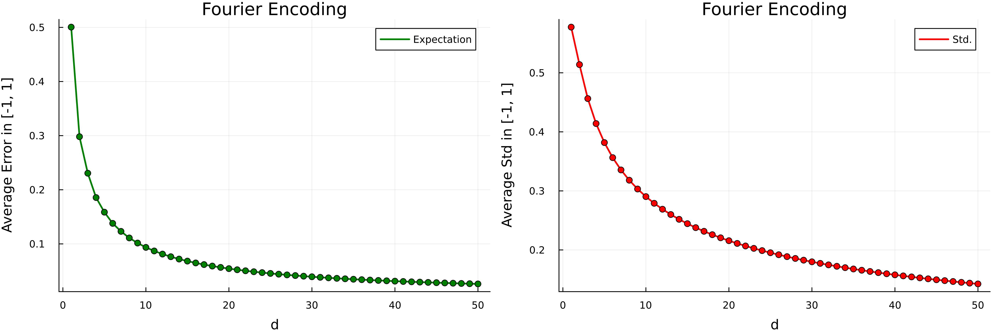

In [126]:
p1 = plot(ds, domain_avg_per_d_fr_exp, label="Expectation", lw=2, c=:green, 
    xlabel="d", ylabel="Average Error in [-1, 1]", title="Fourier Encoding")
p1 = scatter!(ds, domain_avg_per_d_fr_exp, c=:green, label="")

p2 = plot(ds, domain_avg_per_d_fr_std, label="Std.", lw=2, c=:red, 
    xlabel="d", ylabel="Average Std in [-1, 1]", title="Fourier Encoding")
p2 = scatter!(ds, domain_avg_per_d_fr_std, c=:red, label="")

plot(p1, p2, size=(1200, 400), bottom_margin=5mm, left_margin=5mm, dpi=420)

------

# Legendre

In [52]:
ds = collect(1:1:50);
num_evals = 1000;
errors_allx_lgd = Matrix{Float64}(undef, length(ds), num_evals);
stds_allx_lgd = Matrix{Float64}(undef, length(ds), num_evals);
xvals = collect(LinRange((-0.995), (0.995), num_evals));
for (i, d) in enumerate(ds)
    println("Computing d=$d")
    opts=Options(; nsweeps=10, chi_max=40, update_iters=1, verbosity=0, dtype=Complex{Float64}, lg_iter=KLD_iter,
    bbopt=BBOpt("CustomGD"), track_cost=false, eta=0.05, rescale = (false, true), d=d, aux_basis_dim=2, encoding=Basis("Legendre"));
    _, abs_diffs, stds = get_encoding_uncertainty(opts, xvals);
    errors_allx_lgd[i, :] = abs_diffs
    stds_allx_lgd[i, :] = stds
end

Computing d=1
Computing d=2
Computing d=3
Computing d=4
Computing d=5
Computing d=6
Computing d=7
Computing d=8
Computing d=9
Computing d=10
Computing d=11
Computing d=12
Computing d=13
Computing d=14
Computing d=15
Computing d=16
Computing d=17
Computing d=18
Computing d=19
Computing d=20
Computing d=21
Computing d=22
Computing d=23
Computing d=24
Computing d=25
Computing d=26
Computing d=27
Computing d=28
Computing d=29
Computing d=30
Computing d=31
Computing d=32
Computing d=33
Computing d=34
Computing d=35
Computing d=36
Computing d=37
Computing d=38
Computing d=39
Computing d=40
Computing d=41
Computing d=42
Computing d=43
Computing d=44
Computing d=45
Computing d=46
Computing d=47
Computing d=48
Computing d=49
Computing d=50


In [55]:
yvals = ds;

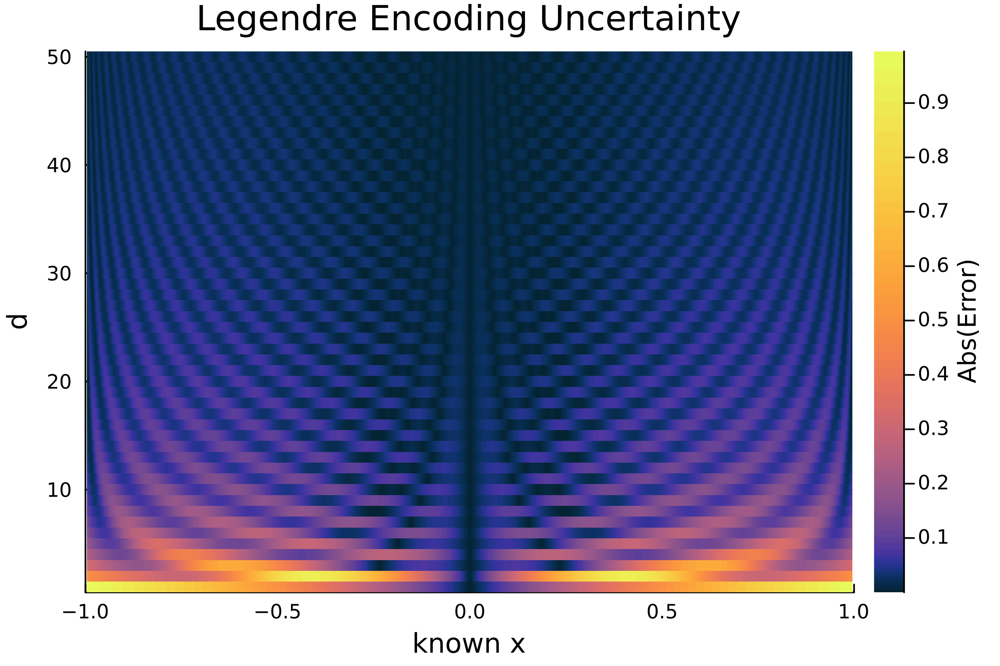

In [114]:
heatmap(xvals, yvals, errors_allx_lgd, title="Legendre Encoding Uncertainty", 
    xlabel="known x", ylabel="d", colorbar_title="Abs(Error)", xlims=(-1,1), c=custom_cmap, dpi=420)
#savefig("legendre_encoding_uncertainty.png")

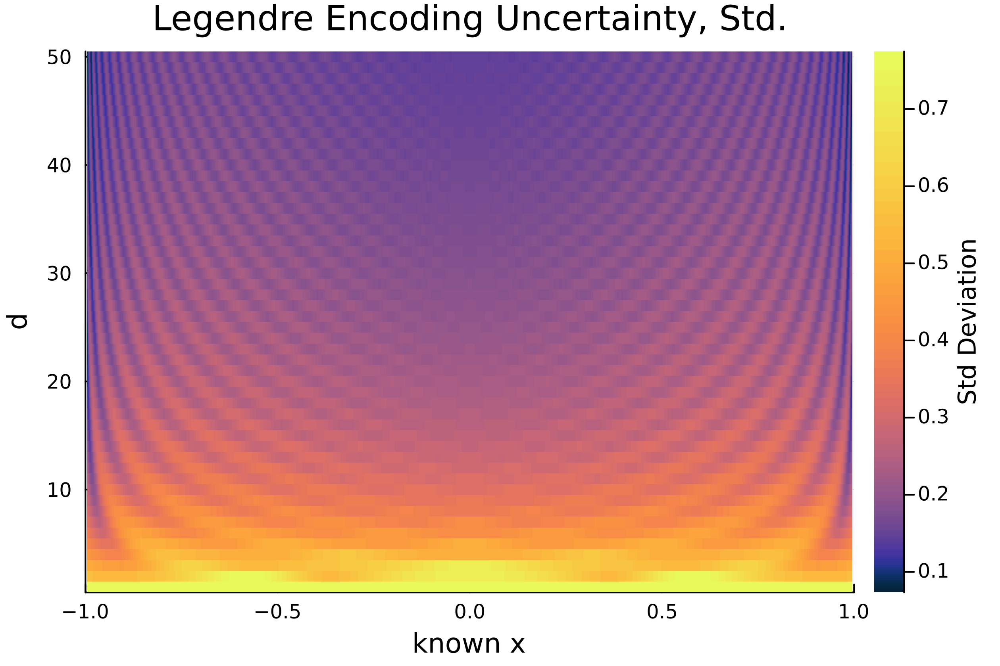

In [117]:
heatmap(xvals, yvals, stds_allx_lgd, title="Legendre Encoding Uncertainty, Std.", 
    xlabel="known x", ylabel="d", colorbar_title="Std Deviation", c=custom_cmap, xlims=(-1, 1), dpi=420)
#savefig("legendre_encoding_uncertainty_std.png")

In [104]:
domain_avg_per_d_lgd_exp = mean(errors_allx_lgd, dims=2);
domain_avg_per_d_lgd_std = mean(stds_allx_lgd, dims=2);
domain_median_per_d_lgd_exp = median(errors_allx_lgd, dims=2)
domain_median_per_d_lgd_std = median(stds_allx_lgd, dims=2);

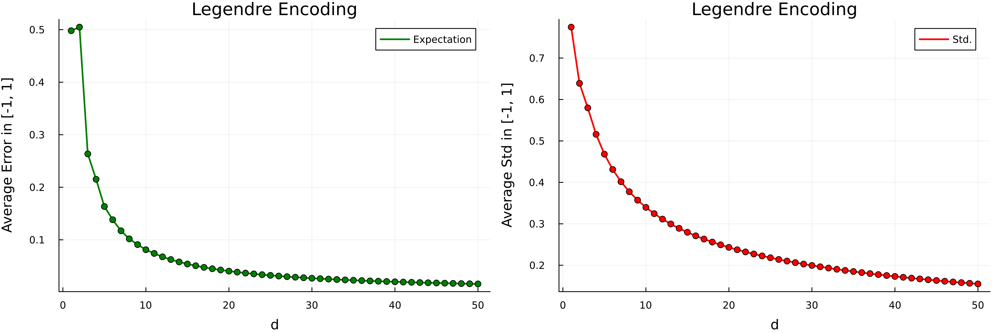

In [102]:
p1 = plot(ds, domain_avg_per_d_lgd_exp, label="Expectation", lw=2, c=:green, 
    xlabel="d", ylabel="Average Error in [-1, 1]", title="Legendre Encoding")
p1 = scatter!(ds, domain_avg_per_d_lgd_exp, c=:green, label="")

p2 = plot(ds, domain_avg_per_d_lgd_std, label="Std.", lw=2, c=:red, 
    xlabel="d", ylabel="Average Std in [-1, 1]", title="Legendre Encoding")
p2 = scatter!(ds, domain_avg_per_d_lgd_std, c=:red, label="")

plot(p1, p2, size=(1200, 400), bottom_margin=5mm, left_margin=5mm, dpi=420)
#savefig("legendre_encoding_domain_avg.svg")

Medians

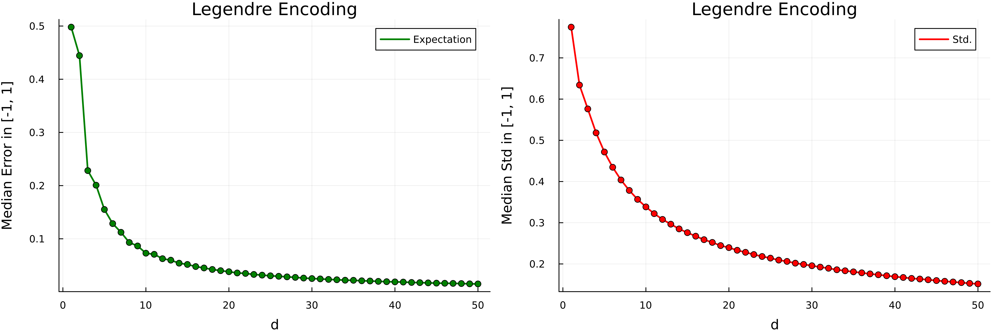

In [109]:
p1 = plot(ds, domain_median_per_d_lgd_exp, label="Expectation", lw=2, c=:green, 
    xlabel="d", ylabel="Median Error in [-1, 1]", title="Legendre Encoding")
p1 = scatter!(ds, domain_median_per_d_lgd_exp, c=:green, label="")

p2 = plot(ds, domain_median_per_d_lgd_std, label="Std.", lw=2, c=:red, 
    xlabel="d", ylabel="Median Std in [-1, 1]", title="Legendre Encoding")
p2 = scatter!(ds, domain_median_per_d_lgd_std, c=:red, label="")

plot(p1, p2, size=(1200, 400), bottom_margin=5mm, left_margin=5mm, dpi=420)
#savefig("legendre_encoding_domain_median.png")

Combined fourier and legendre:

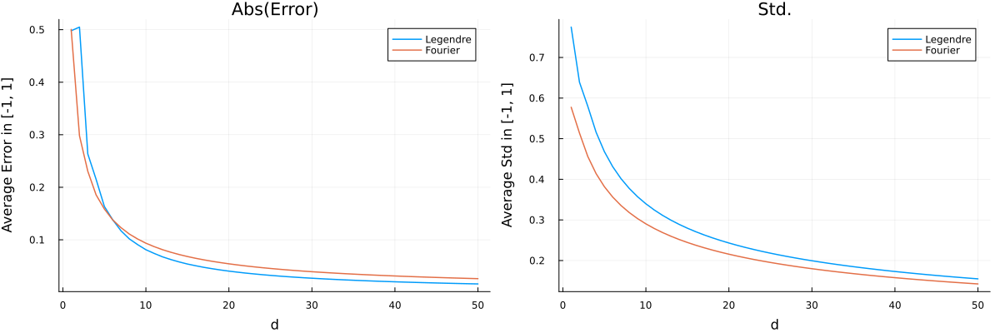

In [154]:
p1 = plot(ds, domain_avg_per_d_lgd_exp, label="Legendre", lw=1.5, 
    xlabel="d", ylabel="Average Error in [-1, 1]", title="Abs(Error)")
p1 = plot!(ds, domain_avg_per_d_fr_exp, label="Fourier", lw=1.5, 
    xlabel="d", ylabel="Average Error in [-1, 1]")

p2 = plot(ds, domain_avg_per_d_lgd_std, label="Legendre", lw=1.5, 
    xlabel="d", ylabel="Average Std in [-1, 1]", title="Std.")
p2 = plot!(ds, domain_avg_per_d_fr_std, label="Fourier", lw=1.5, 
    xlabel="d", ylabel="Average Std in [-1, 1]")

plot(p1, p2, size=(1200, 400), left_margin=5mm, bottom_margin=5mm)
#savefig("encoding_uncertainty_plots/leg_fourier_domain_avg.png")

### Medians
Since the fourier encoding has large error near the boundaries of the data domain, the mean will not be representative of the performance when time series remain well within the boundaries.

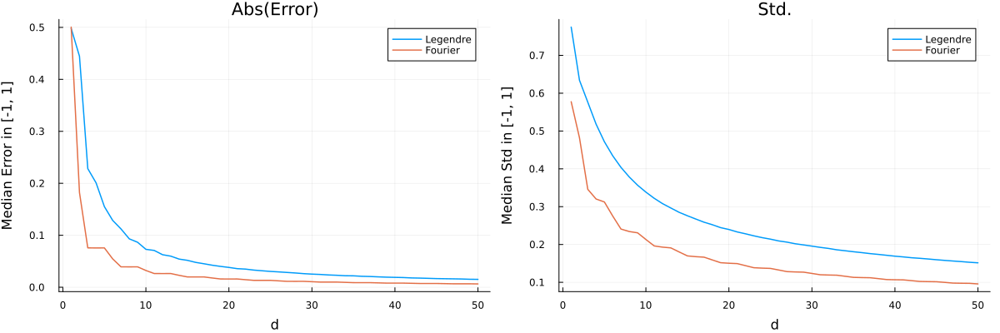

In [159]:
p1 = plot(ds, domain_median_per_d_lgd_exp, label="Legendre", lw=1.5, 
    xlabel="d", ylabel="Median Error in [-1, 1]", title="Abs(Error)")
p1 = plot!(ds, domain_median_per_d_fr_exp, label="Fourier", lw=1.5, 
    xlabel="d", ylabel="Median Error in [-1, 1]")

p2 = plot(ds, domain_median_per_d_lgd_std, label="Legendre", lw=1.5, 
    xlabel="d", ylabel="Median Std in [-1, 1]", title="Std.")
p2 = plot!(ds, domain_median_per_d_fr_std, label="Fourier", lw=1.5, 
    xlabel="d", ylabel="Median Std in [-1, 1]")

plot(p1, p2, size=(1200, 400), left_margin=5mm, bottom_margin=5mm)
#savefig("encoding_uncertainty_plots/leg_fourier_domain_median.svg")

# Time Dependent Encodings

In [6]:
loaded_f = jldopen("/Users/joshua/QuantumMay/histplit_fourier_d14_aux7_chi40.jld2")
opts = read(loaded_f, "opts");
X_train_scaled = read(loaded_f, "X_train_scaled");
y_train = read(loaded_f, "y_train");
enc_args = get_enc_args_from_opts(opts, X_train_scaled, y_train);

Re-encoding the training data to get the encoding arguments...


Looking at uncertainty as a funtion of site number 

In [7]:
sites = collect(1:1:100);
num_evals = 1000;
errors_all_fr_td = Matrix{Float64}(undef, length(sites), num_evals);
stds_all_fr_td = Matrix{Float64}(undef, length(sites), num_evals);
xvals = collect(LinRange((-1), (1), num_evals));
for (i, s) in enumerate(sites)
    println("Computing site: $s")
    _, abs_diffs, stds = get_encoding_uncertainty(opts, enc_args, s, xvals);
    errors_all_fr_td[i, :] = abs_diffs
    stds_all_fr_td[i, :] = stds
end

Computing site: 1
Computing site: 2
Computing site: 3
Computing site: 4
Computing site: 5
Computing site: 6
Computing site: 7
Computing site: 8
Computing site: 9
Computing site: 10
Computing site: 11
Computing site: 12
Computing site: 13
Computing site: 14
Computing site: 15
Computing site: 16
Computing site: 17
Computing site: 18
Computing site: 19
Computing site: 20
Computing site: 21
Computing site: 22
Computing site: 23
Computing site: 24
Computing site: 25
Computing site: 26
Computing site: 27
Computing site: 28
Computing site: 29
Computing site: 30
Computing site: 31
Computing site: 32
Computing site: 33
Computing site: 34
Computing site: 35
Computing site: 36
Computing site: 37
Computing site: 38
Computing site: 39
Computing site: 40
Computing site: 41
Computing site: 42
Computing site: 43
Computing site: 44
Computing site: 45
Computing site: 46
Computing site: 47
Computing site: 48
Computing site: 49
Computing site: 50
Computing site: 51
Computing site: 52
Computing site: 53
Co

In [48]:
custom_cmap = cgrad(:thermal, 80, categorical = true, scale=:exp)

In [119]:
custom_cmap_std = cgrad(:roma, 50, categorical = true)

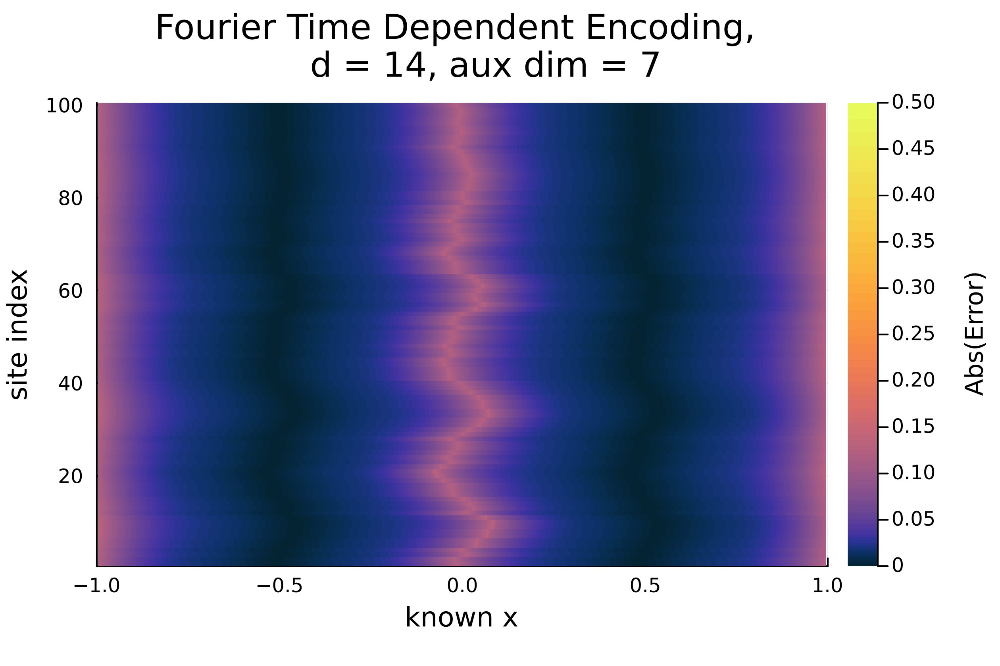

In [71]:
heatmap(xvals, sites, errors_all_fr_td, title="Fourier Time Dependent Encoding, 
    d = 14, aux dim = 7", bottom_margin=5mm, top_margin=5mm, right_margin=5mm,
    xlabel="known x", ylabel="site index", colorbar_title="\nAbs(Error)", c=custom_cmap, dpi=420,
    clim=(0, 0.5), xlims=(-1, 1))
#savefig("encoding_uncertainty_plots/fourier_d14_aux7_encoding_uncertainty.svg")

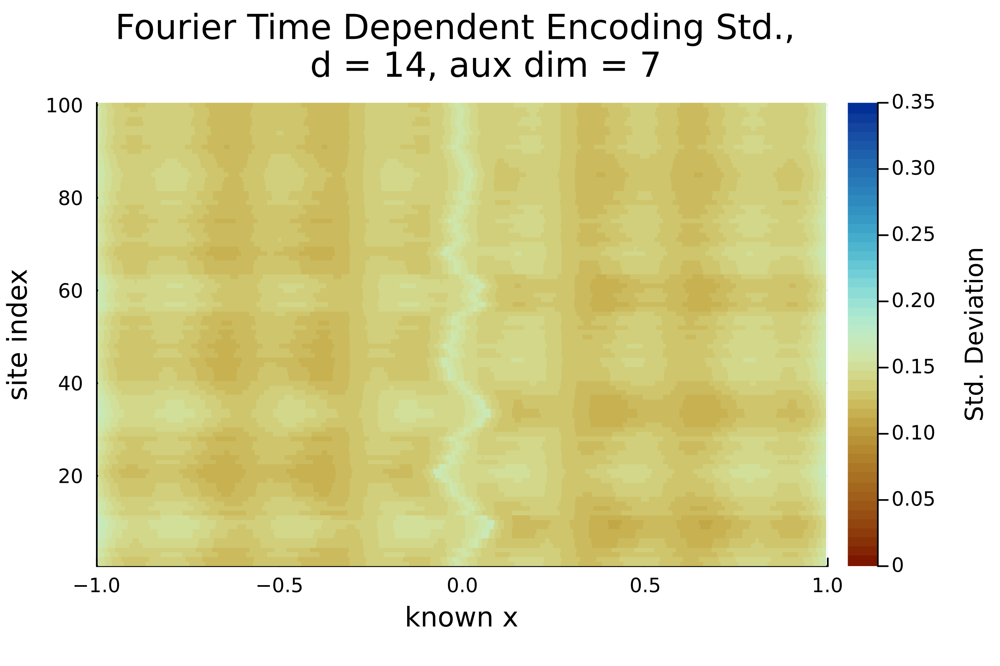

In [117]:
heatmap(xvals, sites, stds_all_fr_td, title="Fourier Time Dependent Encoding Std., 
    d = 14, aux dim = 7", bottom_margin=5mm, top_margin=5mm, right_margin=5mm,
    xlabel="known x", ylabel="site index", colorbar_title="\nStd. Deviation", 
    c=custom_cmap_std, dpi=420, xlims=(-1, 1), clims=(0.0, 0.35))
#savefig("encoding_uncertainty_plots/fourier_d14_aux7_encoding_uncertainty_std.svg")

In [130]:
loaded_f = jldopen("/Users/joshua/QuantumMay/histsplit_legendre_d14_aux7_chi40.jld2")
opts = read(loaded_f, "opts");
X_train_scaled = read(loaded_f, "X_train_scaled");
y_train = read(loaded_f, "y_train");
enc_args = get_enc_args_from_opts(opts, X_train_scaled, y_train);

Re-encoding the training data to get the encoding arguments...


In [131]:
sites = collect(1:1:100);
num_evals = 1000;
errors_all_lgd_td = Matrix{Float64}(undef, length(sites), num_evals);
stds_all_lgd_td = Matrix{Float64}(undef, length(sites), num_evals);
xvals = collect(LinRange((-0.995), (0.995), num_evals));
for (i, s) in enumerate(sites)
    println("Computing site: $s")
    _, abs_diffs, stds = get_encoding_uncertainty(opts, enc_args, s, xvals);
    errors_all_lgd_td[i, :] = abs_diffs
    stds_all_lgd_td[i, :] = stds
end

Computing site: 1
Computing site: 2
Computing site: 3
Computing site: 4
Computing site: 5
Computing site: 6
Computing site: 7
Computing site: 8
Computing site: 9
Computing site: 10
Computing site: 11
Computing site: 12
Computing site: 13
Computing site: 14
Computing site: 15
Computing site: 16
Computing site: 17
Computing site: 18
Computing site: 19
Computing site: 20
Computing site: 21
Computing site: 22
Computing site: 23
Computing site: 24
Computing site: 25
Computing site: 26
Computing site: 27
Computing site: 28
Computing site: 29
Computing site: 30
Computing site: 31
Computing site: 32
Computing site: 33
Computing site: 34
Computing site: 35
Computing site: 36
Computing site: 37
Computing site: 38
Computing site: 39
Computing site: 40
Computing site: 41
Computing site: 42
Computing site: 43
Computing site: 44
Computing site: 45
Computing site: 46
Computing site: 47
Computing site: 48
Computing site: 49
Computing site: 50
Computing site: 51
Computing site: 52
Computing site: 53
Co

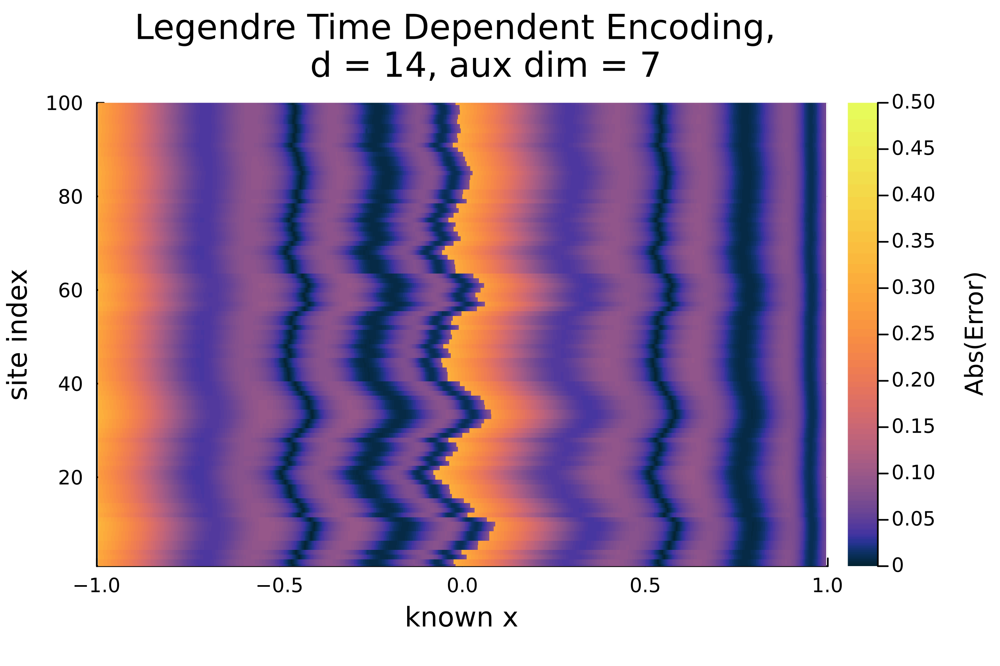

In [132]:
heatmap(xvals, sites, errors_all_lgd_td, title="Legendre Time Dependent Encoding, 
    d = 14, aux dim = 7", bottom_margin=5mm, top_margin=5mm, right_margin=5mm,
    xlabel="known x", ylabel="site index", colorbar_title="\nAbs(Error)",
    c=custom_cmap, xlims=(-1, 1), ylims=(1,100), dpi=420, clims=(0.0, 0.5))
#savefig("encoding_uncertainty_plots/legendre_d14_aux7_encoding_uncertainty.svg")

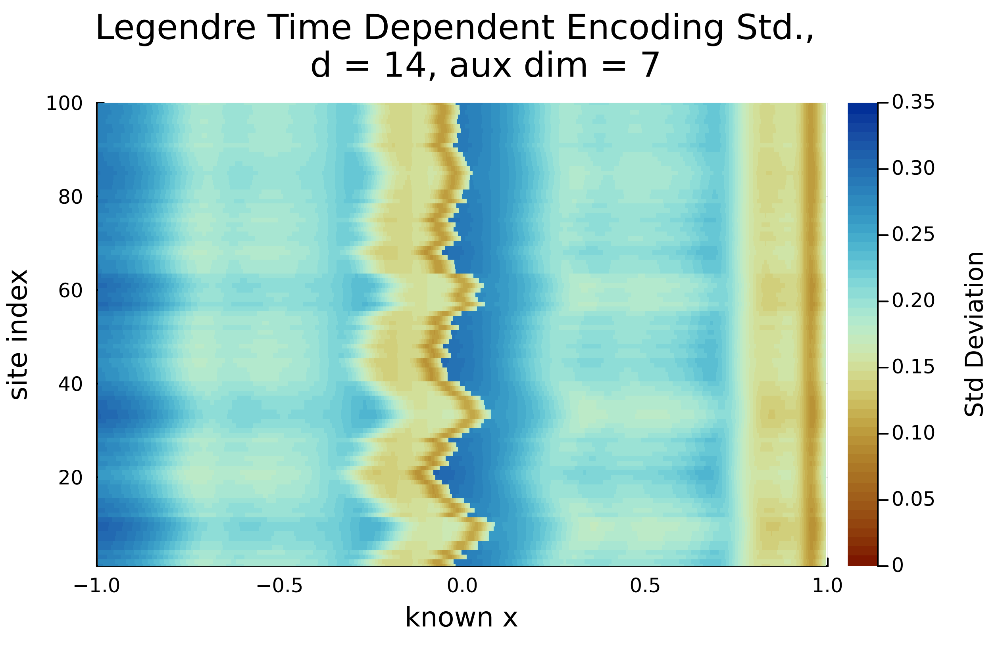

In [133]:
heatmap(xvals, sites, stds_all_lgd_td, title="Legendre Time Dependent Encoding Std., 
    d = 14, aux dim = 7", bottom_margin=5mm, top_margin=5mm, right_margin=5mm,
    xlabel="known x", ylabel="site index", colorbar_title="\nStd Deviation", c=custom_cmap_std, xlims=(-1, 1), 
    ylims=(1, 100), dpi=420, clims=(0.0, 0.35))
#savefig("encoding_uncertainty_plots/legendre_d14_aux7_encoding_uncertainty_std.svg")

In [134]:
sitewise_mean_error_over_domain_lgd = mean(errors_all_lgd_td, dims=2);
sitewise_mean_error_over_domain_fr = mean(errors_all_fr_td, dims=2);
sitewise_mean_std_over_domain_lgd = mean(stds_all_lgd_td, dims=2);
sitewise_mean_std_over_domain_fr = mean(stds_all_fr_td, dims=2);

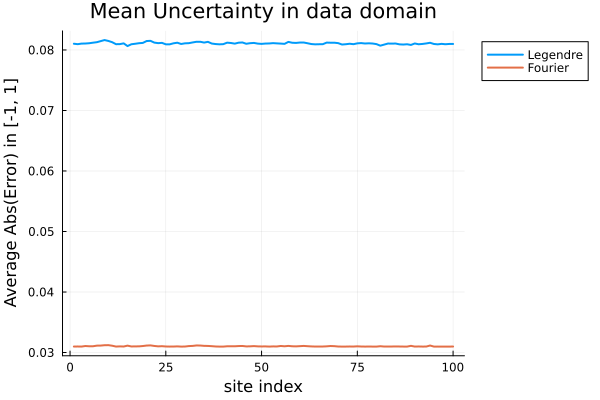

In [138]:
plot(sites, sitewise_mean_error_over_domain_lgd, label="Legendre", title = "Mean Uncertainty in data domain", 
    legend=:outertopright, xlabel="site index", ylabel="Average Abs(Error) in [-1, 1]", lw=2)
plot!(sites, sitewise_mean_error_over_domain_fr, label="Fourier", lw=2)
#savefig("encoding_uncertainty_plots/time_dep_mean_uncert.svg")

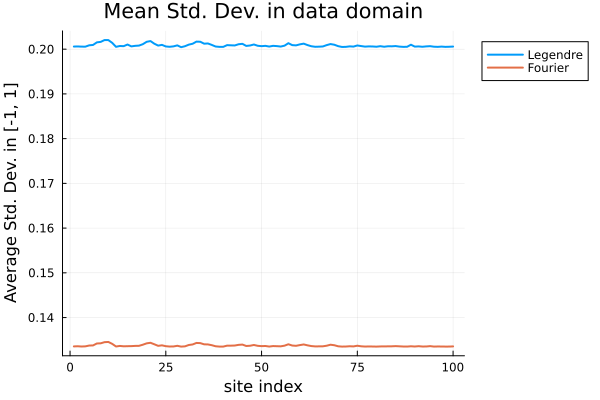

In [143]:
plot(sites, sitewise_mean_std_over_domain_lgd, label="Legendre", title = "Mean Std. Dev. in data domain", 
    legend=:outertopright, xlabel="site index", ylabel="Average Std. Dev. in [-1, 1]", lw=2)
plot!(sites, sitewise_mean_std_over_domain_fr, label="Fourier", lw=2)
#savefig("encoding_uncertainty_plots/time_dep_mean_std.svg")

# Other combinations of dim, aux dim

In [8]:
loaded_f = jldopen("/Users/joshua/QuantumMay/histsplit_fourier_d12_aux6_chi40.jld2")
opts = read(loaded_f, "opts");
X_train_scaled = read(loaded_f, "X_train_scaled");
y_train = read(loaded_f, "y_train");
enc_args = get_enc_args_from_opts(opts, X_train_scaled, y_train);

Re-encoding the training data to get the encoding arguments...


In [9]:
sites = collect(1:1:100);
num_evals = 1000;
errors_all_fr12_6_td = Matrix{Float64}(undef, length(sites), num_evals);
stds_all_fr12_6_td = Matrix{Float64}(undef, length(sites), num_evals);
xvals = collect(LinRange((-1), (1), num_evals));
for (i, s) in enumerate(sites)
    println("Computing site: $s")
    _, abs_diffs, stds = get_encoding_uncertainty(opts, enc_args, s, xvals);
    errors_all_fr12_6_td[i, :] = abs_diffs
    stds_all_fr12_6_td[i, :] = stds
end

Computing site: 1
Computing site: 2
Computing site: 3
Computing site: 4
Computing site: 5
Computing site: 6
Computing site: 7
Computing site: 8
Computing site: 9
Computing site: 10
Computing site: 11
Computing site: 12
Computing site: 13
Computing site: 14
Computing site: 15
Computing site: 16
Computing site: 17
Computing site: 18
Computing site: 19
Computing site: 20
Computing site: 21
Computing site: 22
Computing site: 23
Computing site: 24
Computing site: 25
Computing site: 26
Computing site: 27
Computing site: 28
Computing site: 29
Computing site: 30
Computing site: 31
Computing site: 32
Computing site: 33
Computing site: 34
Computing site: 35
Computing site: 36
Computing site: 37
Computing site: 38
Computing site: 39
Computing site: 40
Computing site: 41
Computing site: 42
Computing site: 43
Computing site: 44
Computing site: 45
Computing site: 46
Computing site: 47
Computing site: 48
Computing site: 49
Computing site: 50
Computing site: 51
Computing site: 52
Computing site: 53
Co

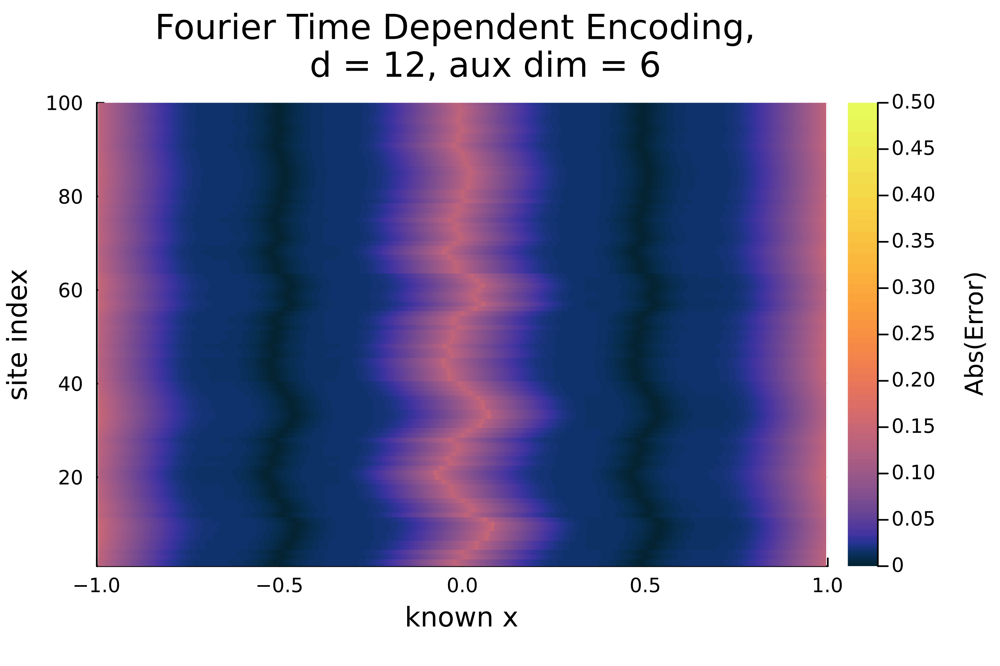

In [266]:
heatmap(xvals, sites, errors_all_fr12_6_td, title="Fourier Time Dependent Encoding, 
    d = 12, aux dim = 6", bottom_margin=5mm, top_margin=5mm, right_margin=5mm,
    xlabel="known x", ylabel="site index", colorbar_title="\nAbs(Error)",
    c=custom_cmap, xlims=(-1, 1), ylims=(1,100), dpi=420, clim=(0, 0.5))
#savefig("encoding_uncertainty_plots/fourier_d12_aux6_encoding_uncertainty.svg")

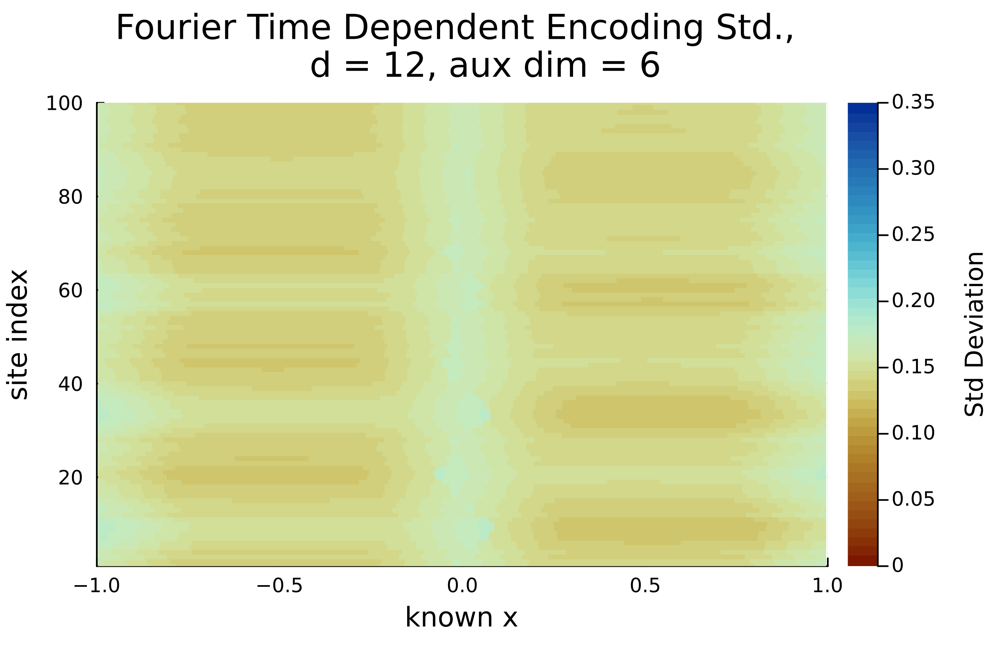

In [269]:
heatmap(xvals, sites, stds_all_fr12_6_td, title="Fourier Time Dependent Encoding Std., 
    d = 12, aux dim = 6", bottom_margin=5mm, top_margin=5mm, right_margin=5mm,
    xlabel="known x", ylabel="site index", colorbar_title="\nStd Deviation", c=custom_cmap_std, xlims=(-1, 1), 
    ylims=(1, 100), dpi=420, clims=(0.0, 0.35))
#savefig("encoding_uncertainty_plots/fourier_d12_aux6_encoding_uncertainty_std.svg")

In [10]:
loaded_f = jldopen("/Users/joshua/QuantumMay/histplit_fourier_d10_aux5_chi40.jld2")
opts = read(loaded_f, "opts");
X_train_scaled = read(loaded_f, "X_train_scaled");
y_train = read(loaded_f, "y_train");
enc_args = get_enc_args_from_opts(opts, X_train_scaled, y_train);

Re-encoding the training data to get the encoding arguments...


In [11]:
sites = collect(1:1:100);
num_evals = 1000;
errors_all_fr10_5_td = Matrix{Float64}(undef, length(sites), num_evals);
stds_all_fr10_5_td = Matrix{Float64}(undef, length(sites), num_evals);
xvals = collect(LinRange((-1), (1), num_evals));
for (i, s) in enumerate(sites)
    println("Computing site: $s")
    _, abs_diffs, stds = get_encoding_uncertainty(opts, enc_args, s, xvals);
    errors_all_fr10_5_td[i, :] = abs_diffs
    stds_all_fr10_5_td[i, :] = stds
end

Computing site: 1
Computing site: 2
Computing site: 3
Computing site: 4
Computing site: 5
Computing site: 6
Computing site: 7
Computing site: 8
Computing site: 9
Computing site: 10
Computing site: 11
Computing site: 12
Computing site: 13
Computing site: 14
Computing site: 15
Computing site: 16
Computing site: 17
Computing site: 18
Computing site: 19
Computing site: 20
Computing site: 21
Computing site: 22
Computing site: 23
Computing site: 24
Computing site: 25
Computing site: 26
Computing site: 27
Computing site: 28
Computing site: 29
Computing site: 30
Computing site: 31
Computing site: 32
Computing site: 33
Computing site: 34
Computing site: 35
Computing site: 36
Computing site: 37
Computing site: 38
Computing site: 39
Computing site: 40
Computing site: 41
Computing site: 42
Computing site: 43
Computing site: 44
Computing site: 45
Computing site: 46
Computing site: 47
Computing site: 48
Computing site: 49
Computing site: 50
Computing site: 51
Computing site: 52
Computing site: 53
Co

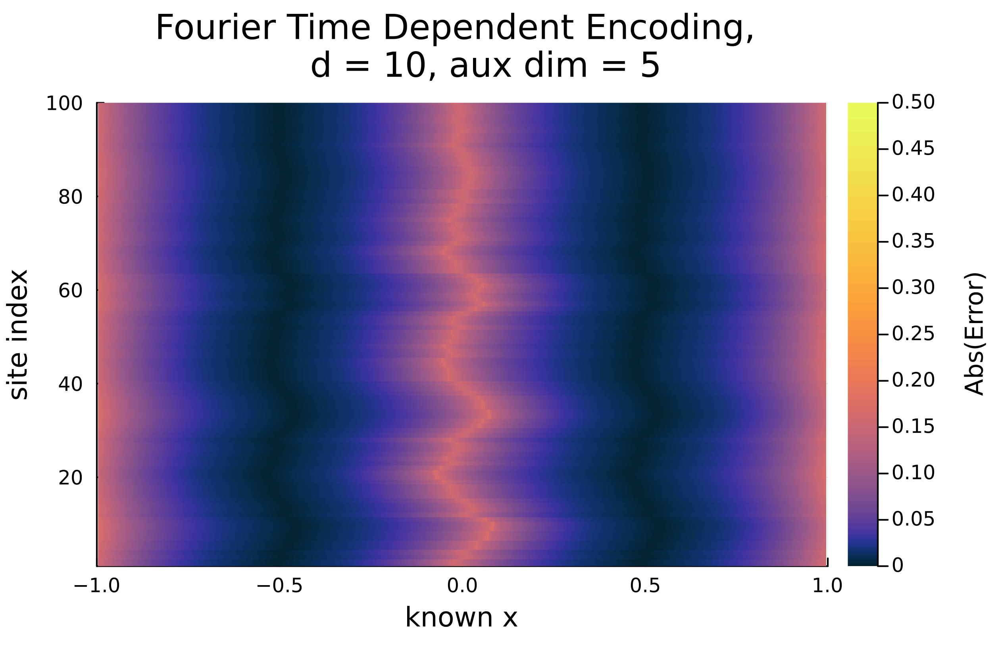

In [272]:
heatmap(xvals, sites, errors_all_fr10_5_td, title="Fourier Time Dependent Encoding, 
    d = 10, aux dim = 5", bottom_margin=5mm, top_margin=5mm, right_margin=5mm,
    xlabel="known x", ylabel="site index", colorbar_title="\nAbs(Error)",
    c=custom_cmap, xlims=(-1, 1), ylims=(1,100), dpi=420, clim=(0, 0.5))
#savefig("encoding_uncertainty_plots/fourier_d10_aux5_encoding_uncertainty.svg")

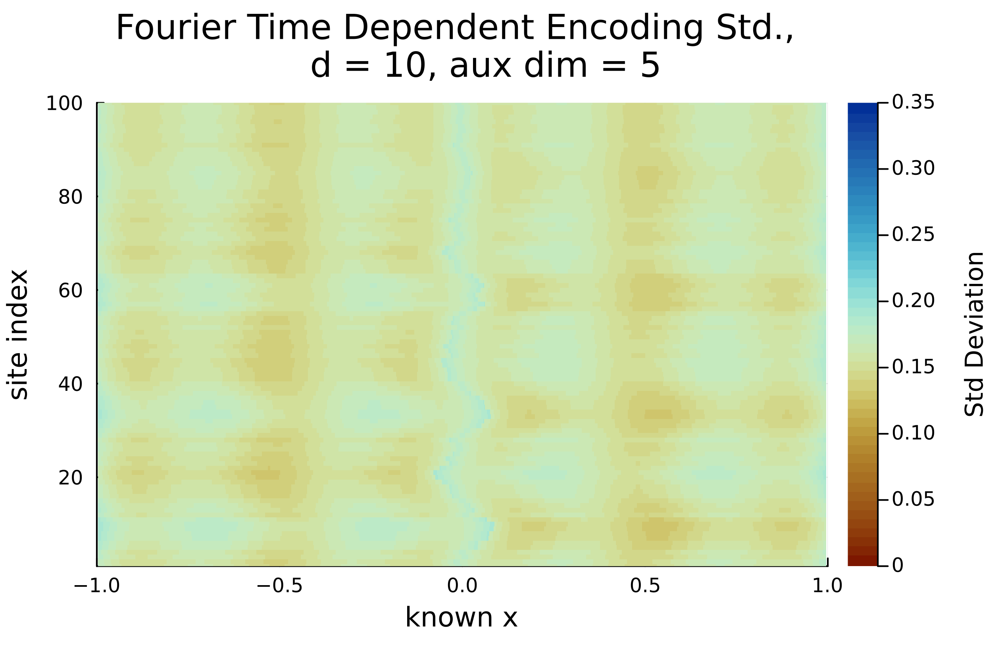

In [274]:
heatmap(xvals, sites, stds_all_fr10_5_td, title="Fourier Time Dependent Encoding Std., 
    d = 10, aux dim = 5", bottom_margin=5mm, top_margin=5mm, right_margin=5mm,
    xlabel="known x", ylabel="site index", colorbar_title="\nStd Deviation", c=custom_cmap_std, xlims=(-1, 1), 
    ylims=(1, 100), dpi=420, clims=(0.0, 0.35))
#savefig("encoding_uncertainty_plots/fourier_d10_aux5_encoding_uncertainty_std.svg")

In [12]:
loaded_f = jldopen("/Users/joshua/QuantumMay/histplit_fourier_d8_aux4_chi40.jld2")
opts = read(loaded_f, "opts");
X_train_scaled = read(loaded_f, "X_train_scaled");
y_train = read(loaded_f, "y_train");
enc_args = get_enc_args_from_opts(opts, X_train_scaled, y_train);

Re-encoding the training data to get the encoding arguments...


In [13]:
sites = collect(1:1:100);
num_evals = 1000;
errors_all_fr8_4_td = Matrix{Float64}(undef, length(sites), num_evals);
stds_all_fr8_4_td = Matrix{Float64}(undef, length(sites), num_evals);
xvals = collect(LinRange((-1), (1), num_evals));
for (i, s) in enumerate(sites)
    println("Computing site: $s")
    _, abs_diffs, stds = get_encoding_uncertainty(opts, enc_args, s, xvals);
    errors_all_fr8_4_td[i, :] = abs_diffs
    stds_all_fr8_4_td[i, :] = stds
end

Computing site: 1
Computing site: 2
Computing site: 3
Computing site: 4
Computing site: 5
Computing site: 6
Computing site: 7
Computing site: 8
Computing site: 9
Computing site: 10
Computing site: 11
Computing site: 12
Computing site: 13
Computing site: 14
Computing site: 15
Computing site: 16
Computing site: 17
Computing site: 18
Computing site: 19
Computing site: 20
Computing site: 21
Computing site: 22
Computing site: 23
Computing site: 24
Computing site: 25
Computing site: 26
Computing site: 27
Computing site: 28
Computing site: 29
Computing site: 30
Computing site: 31
Computing site: 32
Computing site: 33
Computing site: 34
Computing site: 35
Computing site: 36
Computing site: 37
Computing site: 38
Computing site: 39
Computing site: 40
Computing site: 41
Computing site: 42
Computing site: 43
Computing site: 44
Computing site: 45
Computing site: 46
Computing site: 47
Computing site: 48
Computing site: 49
Computing site: 50
Computing site: 51
Computing site: 52
Computing site: 53
Co

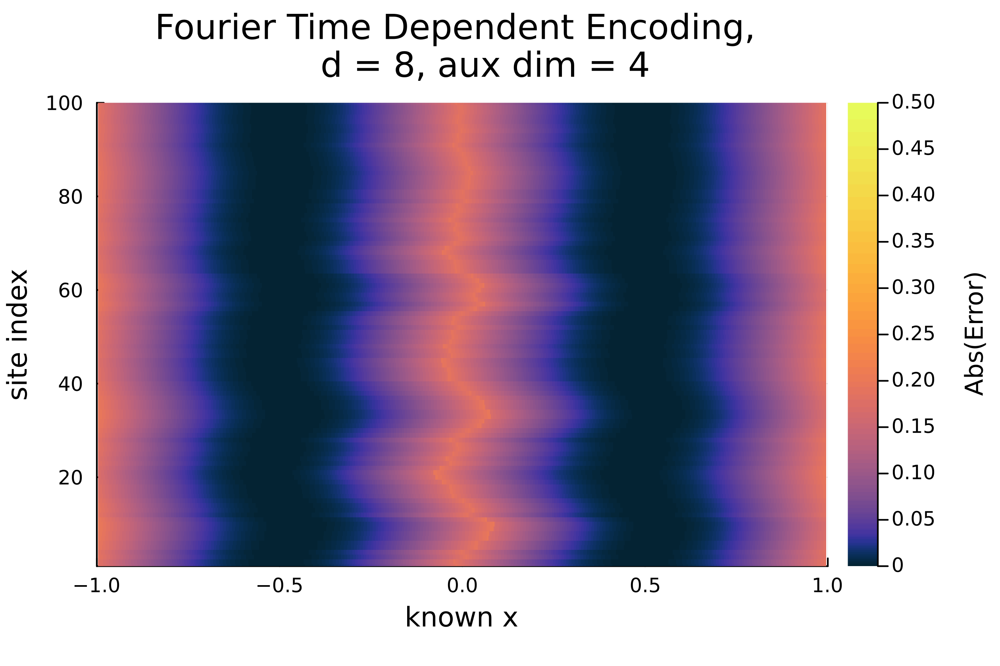

In [283]:
heatmap(xvals, sites, errors_all_fr8_4_td, title="Fourier Time Dependent Encoding, 
    d = 8, aux dim = 4", bottom_margin=5mm, top_margin=5mm, right_margin=5mm,
    xlabel="known x", ylabel="site index", colorbar_title="\nAbs(Error)",
    c=custom_cmap, xlims=(-1, 1), ylims=(1,100), dpi=420, clim=(0, 0.5))
#savefig("encoding_uncertainty_plots/fourier_d8_aux4_encoding_uncertainty.svg")

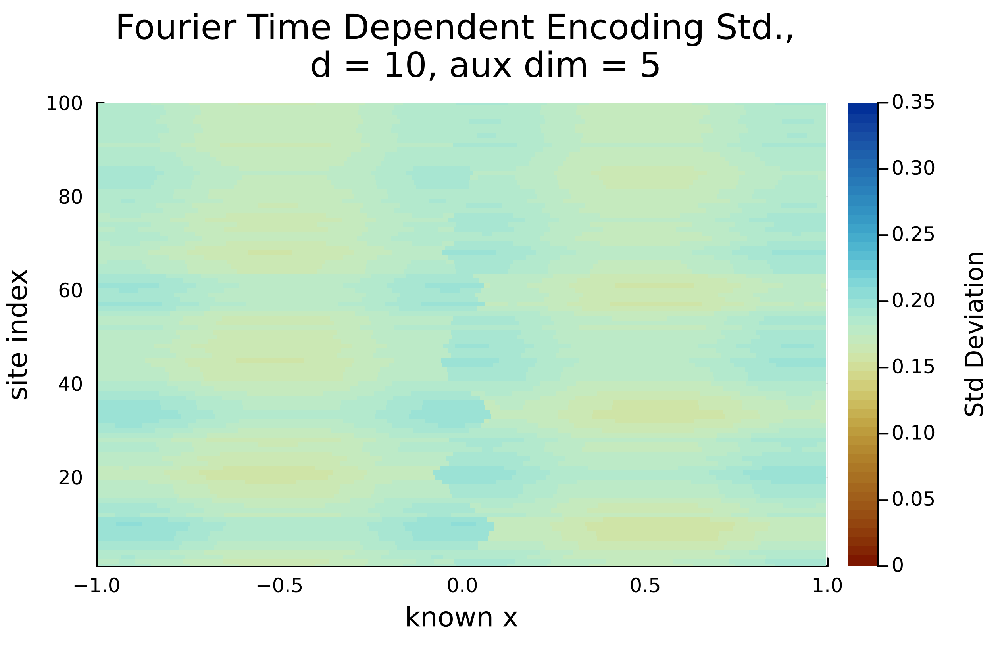

In [285]:
heatmap(xvals, sites, stds_all_fr8_4_td, title="Fourier Time Dependent Encoding Std., 
    d = 10, aux dim = 5", bottom_margin=5mm, top_margin=5mm, right_margin=5mm,
    xlabel="known x", ylabel="site index", colorbar_title="\nStd Deviation", c=custom_cmap_std, xlims=(-1, 1), 
    ylims=(1, 100), dpi=420, clims=(0.0, 0.35))
#savefig("encoding_uncertainty_plots/fourier_d8_aux4_encoding_uncertainty_std.svg")

In [41]:
sitewise_mean_error_over_domain_fr12_6 = mean(errors_all_fr12_6_td, dims=2);
sitewise_mean_std_over_domain_fr12_6 = mean(stds_all_fr12_6_td, dims=2);

sitewise_mean_error_over_domain_fr10_5 = mean(errors_all_fr10_5_td, dims=2);
sitewise_mean_std_over_domain_fr10_5 = mean(stds_all_fr10_5_td, dims=2);


sitewise_mean_error_over_domain_fr8_4 = mean(errors_all_fr8_4_td, dims=2);
sitewise_mean_std_over_domain_fr8_4 = mean(stds_all_fr8_4_td, dims=2);

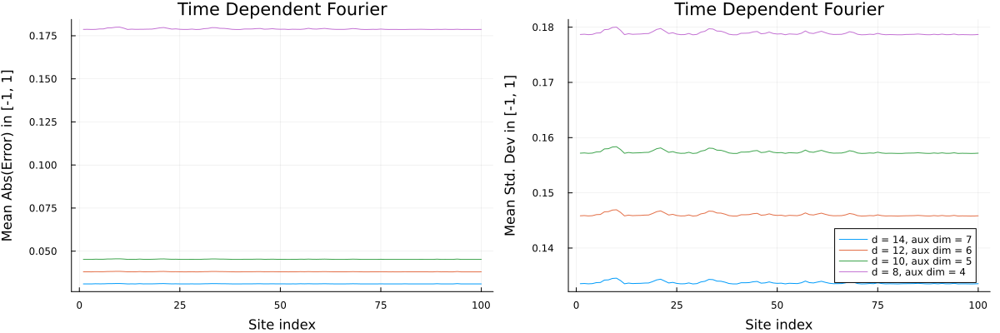

In [106]:
p1 = plot(sites, sitewise_mean_error_over_domain_fr, title="Time Dependent Fourier", 
    xlabel="Site index", ylabel="Mean Abs(Error) in [-1, 1]", label="d = 14, aux dim = 7", legend=false)
p1 = plot!(sites, sitewise_mean_error_over_domain_fr12_6, label="d = 12, aux dim = 6")
p1 = plot!(sites, sitewise_mean_error_over_domain_fr10_5, label="d = 10, aux dim = 5")
p1 = plot!(sites, sitewise_mean_std_over_domain_fr8_4, label="d = 8, aux dim = 4")

p2 = plot(sites, sitewise_mean_std_over_domain_fr, title="Time Dependent Fourier", 
   xlabel="Site index", ylabel="Mean Std. Dev in [-1, 1]", label="d = 14, aux dim = 7", legend=:bottomright)
p2 = plot!(sites, sitewise_mean_std_over_domain_fr12_6, label="d = 12, aux dim = 6")
p2 = plot!(sites, sitewise_mean_std_over_domain_fr10_5, label="d = 10, aux dim = 5")
p2 = plot!(sites, sitewise_mean_std_over_domain_fr8_4, label="d = 8, aux dim = 4")

plot(p1, p2, size=(1200, 400), left_margin=5mm, bottom_margin=5mm)
#savefig("encoding_uncertainty_plots/time_dep_fourier_mean_compare.svg")

#### Other Legendre

In [114]:
loaded_f = jldopen("/Users/joshua/QuantumMay/histplit_legendre_d12_aux6_chi40.jld2")
opts = read(loaded_f, "opts");
X_train_scaled = read(loaded_f, "X_train_scaled");
y_train = read(loaded_f, "y_train");
enc_args = get_enc_args_from_opts(opts, X_train_scaled, y_train);

Re-encoding the training data to get the encoding arguments...


In [115]:
sites = collect(1:1:100);
num_evals = 1000;
errors_all_lgd_12_6_td = Matrix{Float64}(undef, length(sites), num_evals);
stds_all_lgd_12_6_td = Matrix{Float64}(undef, length(sites), num_evals);
xvals = collect(LinRange((-0.995), (0.995), num_evals));
for (i, s) in enumerate(sites)
    println("Computing site: $s")
    _, abs_diffs, stds = get_encoding_uncertainty(opts, enc_args, s, xvals);
    errors_all_lgd_12_6_td[i, :] = abs_diffs
    stds_all_lgd_12_6_td[i, :] = stds
end

Computing site: 1
Computing site: 2
Computing site: 3
Computing site: 4
Computing site: 5
Computing site: 6
Computing site: 7
Computing site: 8
Computing site: 9
Computing site: 10
Computing site: 11
Computing site: 12
Computing site: 13
Computing site: 14
Computing site: 15
Computing site: 16
Computing site: 17
Computing site: 18
Computing site: 19
Computing site: 20
Computing site: 21
Computing site: 22
Computing site: 23
Computing site: 24
Computing site: 25
Computing site: 26
Computing site: 27
Computing site: 28
Computing site: 29
Computing site: 30
Computing site: 31
Computing site: 32
Computing site: 33
Computing site: 34
Computing site: 35
Computing site: 36
Computing site: 37
Computing site: 38
Computing site: 39
Computing site: 40
Computing site: 41
Computing site: 42
Computing site: 43
Computing site: 44
Computing site: 45
Computing site: 46
Computing site: 47
Computing site: 48
Computing site: 49
Computing site: 50
Computing site: 51
Computing site: 52
Computing site: 53
Co

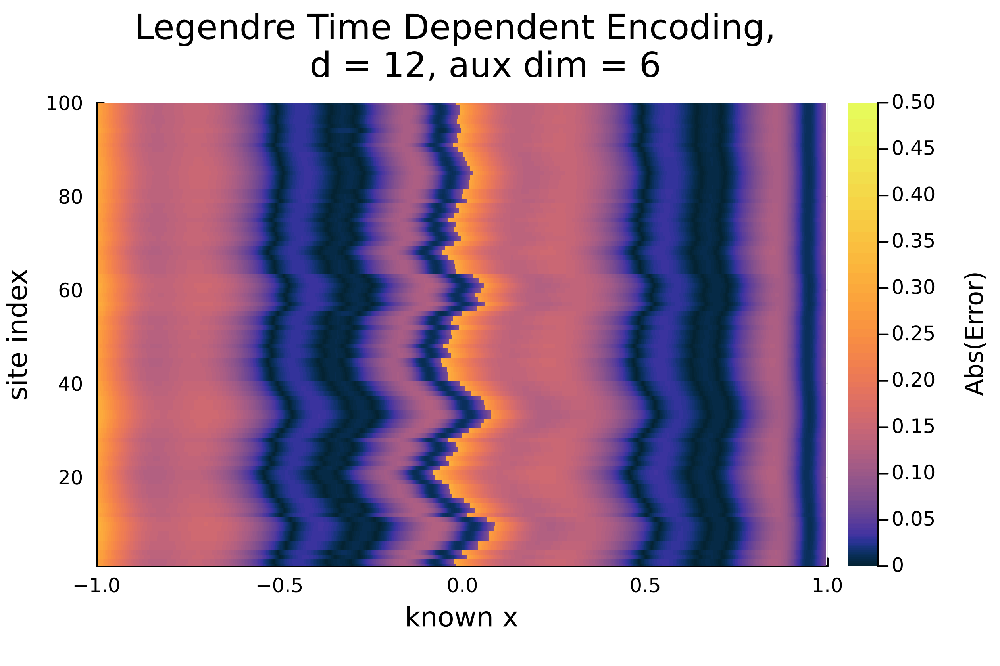

In [291]:
heatmap(xvals, sites, errors_all_lgd_12_6_td, title="Legendre Time Dependent Encoding, 
    d = 12, aux dim = 6", bottom_margin=5mm, top_margin=5mm, right_margin=5mm,
    xlabel="known x", ylabel="site index", colorbar_title="\nAbs(Error)",
    c=custom_cmap, xlims=(-1, 1), ylims=(1,100), dpi=420, clim=(0, 0.5))
#savefig("encoding_uncertainty_plots/legendre_d12_aux6_encoding_uncertainty.svg")

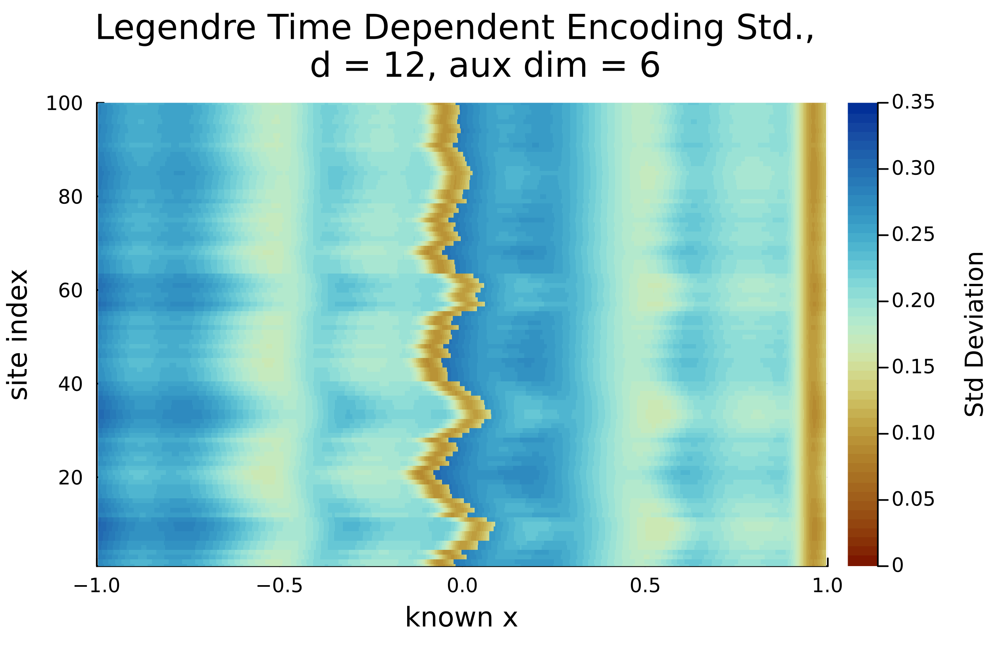

In [293]:
heatmap(xvals, sites, stds_all_lgd_12_6_td, title="Legendre Time Dependent Encoding Std., 
    d = 12, aux dim = 6", bottom_margin=5mm, top_margin=5mm, right_margin=5mm,
    xlabel="known x", ylabel="site index", colorbar_title="\nStd Deviation", c=custom_cmap_std, xlims=(-1, 1), 
    ylims=(1, 100), dpi=420, clims=(0.0, 0.35))
#savefig("encoding_uncertainty_plots/legendre_d12_aux6_encoding_uncertainty_std.svg")

In [125]:
sitewise_mean_error_over_domain_lgd_12_6

100×1 Matrix{Float64}:
 0.085893993570958
 0.08582106286596962
 0.08591381682432594
 0.08597666540874378
 0.08598300428496329
 0.08607728887071962
 0.08616970529517262
 0.08635162007590613
 0.08653607029400534
 0.08638878454942334
 ⋮
 0.08585642916893087
 0.08594402973229381
 0.08619572802653463
 0.08585023047830218
 0.0857917868241181
 0.08587132864627736
 0.08580814664351319
 0.08585665254370305
 0.08585624037574002

In [145]:
loaded_f = jldopen("/Users/joshua/QuantumMay/histsplit_legendre_d10_aux5_chi40.jld2")
opts = read(loaded_f, "opts");
X_train_scaled = read(loaded_f, "X_train_scaled");
y_train = read(loaded_f, "y_train");
enc_args = get_enc_args_from_opts(opts, X_train_scaled, y_train);

Re-encoding the training data to get the encoding arguments...


In [146]:
sites = collect(1:1:100);
num_evals = 1000;
errors_all_lgd_10_5_td = Matrix{Float64}(undef, length(sites), num_evals);
stds_all_lgd_10_5_td = Matrix{Float64}(undef, length(sites), num_evals);
xvals = collect(LinRange((-0.995), (0.995), num_evals));
for (i, s) in enumerate(sites)
    println("Computing site: $s")
    _, abs_diffs, stds = get_encoding_uncertainty(opts, enc_args, s, xvals);
    errors_all_lgd_10_5_td[i, :] = abs_diffs
    stds_all_lgd_10_5_td[i, :] = stds
end

Computing site: 1
Computing site: 2
Computing site: 3
Computing site: 4
Computing site: 5
Computing site: 6
Computing site: 7
Computing site: 8
Computing site: 9
Computing site: 10
Computing site: 11
Computing site: 12
Computing site: 13
Computing site: 14
Computing site: 15
Computing site: 16
Computing site: 17
Computing site: 18
Computing site: 19
Computing site: 20
Computing site: 21
Computing site: 22
Computing site: 23
Computing site: 24
Computing site: 25
Computing site: 26
Computing site: 27
Computing site: 28
Computing site: 29
Computing site: 30
Computing site: 31
Computing site: 32
Computing site: 33
Computing site: 34
Computing site: 35
Computing site: 36
Computing site: 37
Computing site: 38
Computing site: 39
Computing site: 40
Computing site: 41
Computing site: 42
Computing site: 43
Computing site: 44
Computing site: 45
Computing site: 46
Computing site: 47
Computing site: 48
Computing site: 49
Computing site: 50
Computing site: 51
Computing site: 52
Computing site: 53
Co

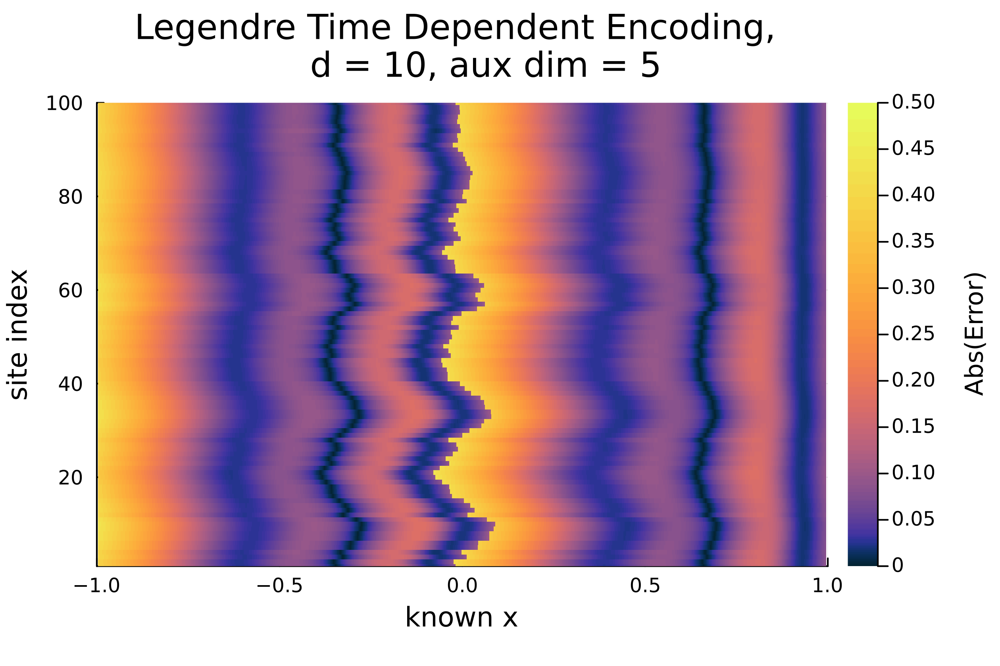

In [295]:
heatmap(xvals, sites, errors_all_lgd_10_5_td, title="Legendre Time Dependent Encoding, 
    d = 10, aux dim = 5", bottom_margin=5mm, top_margin=5mm, right_margin=5mm,
    xlabel="known x", ylabel="site index", colorbar_title="\nAbs(Error)",
    c=custom_cmap, xlims=(-1, 1), ylims=(1,100), dpi=420, clim=(0, 0.5))
#savefig("encoding_uncertainty_plots/legendre_d10_aux5_encoding_uncertainty.svg")

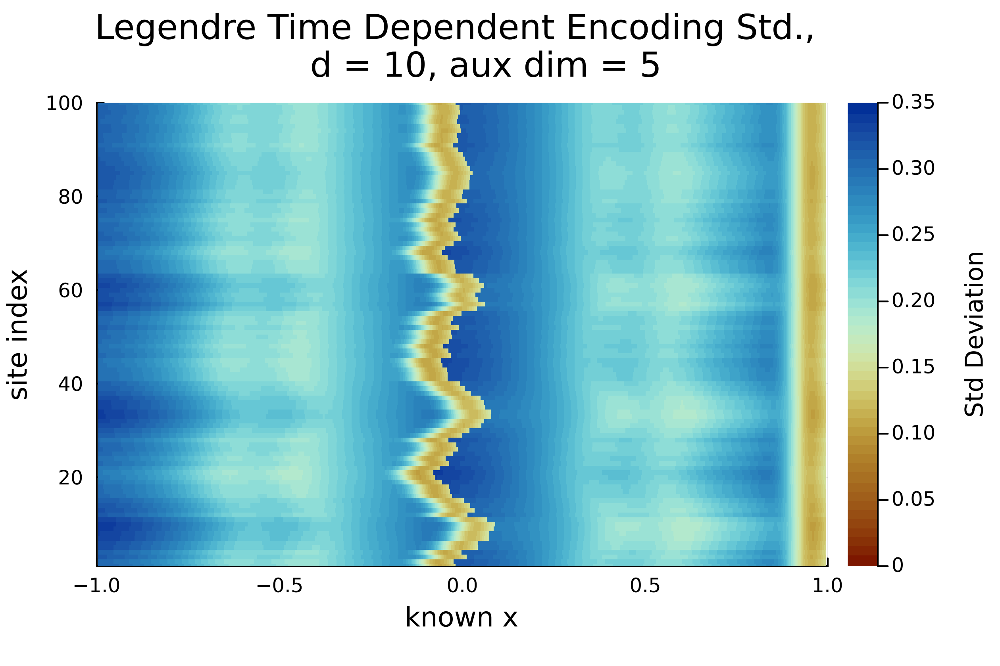

In [299]:
heatmap(xvals, sites, stds_all_lgd_10_5_td, title="Legendre Time Dependent Encoding Std., 
    d = 10, aux dim = 5", bottom_margin=5mm, top_margin=5mm, right_margin=5mm,
    xlabel="known x", ylabel="site index", colorbar_title="\nStd Deviation", c=custom_cmap_std, xlims=(-1, 1), 
    ylims=(1, 100), dpi=420, clims=(0.0, 0.35))
#savefig("encoding_uncertainty_plots/legendre_d10_aux5_encoding_uncertainty_std.svg")

In [162]:
loaded_f = jldopen("/Users/joshua/QuantumMay/histsplit_legendre_d8_aux4_chi40.jld2")
opts = read(loaded_f, "opts");
X_train_scaled = read(loaded_f, "X_train_scaled");
y_train = read(loaded_f, "y_train");
enc_args = get_enc_args_from_opts(opts, X_train_scaled, y_train);

Re-encoding the training data to get the encoding arguments...


In [163]:
sites = collect(1:1:100);
num_evals = 1000;
errors_all_lgd_8_4_td = Matrix{Float64}(undef, length(sites), num_evals);
stds_all_lgd_8_4_td = Matrix{Float64}(undef, length(sites), num_evals);
xvals = collect(LinRange((-0.995), (0.995), num_evals));
for (i, s) in enumerate(sites)
    println("Computing site: $s")
    _, abs_diffs, stds = get_encoding_uncertainty(opts, enc_args, s, xvals);
    errors_all_lgd_8_4_td[i, :] = abs_diffs
    stds_all_lgd_8_4_td[i, :] = stds
end

Computing site: 1
Computing site: 2
Computing site: 3
Computing site: 4
Computing site: 5
Computing site: 6
Computing site: 7
Computing site: 8
Computing site: 9
Computing site: 10
Computing site: 11
Computing site: 12
Computing site: 13
Computing site: 14
Computing site: 15
Computing site: 16
Computing site: 17
Computing site: 18
Computing site: 19
Computing site: 20
Computing site: 21
Computing site: 22
Computing site: 23
Computing site: 24
Computing site: 25
Computing site: 26
Computing site: 27
Computing site: 28
Computing site: 29
Computing site: 30
Computing site: 31
Computing site: 32
Computing site: 33
Computing site: 34
Computing site: 35
Computing site: 36
Computing site: 37
Computing site: 38
Computing site: 39
Computing site: 40
Computing site: 41
Computing site: 42
Computing site: 43
Computing site: 44
Computing site: 45
Computing site: 46
Computing site: 47
Computing site: 48
Computing site: 49
Computing site: 50
Computing site: 51
Computing site: 52
Computing site: 53
Co

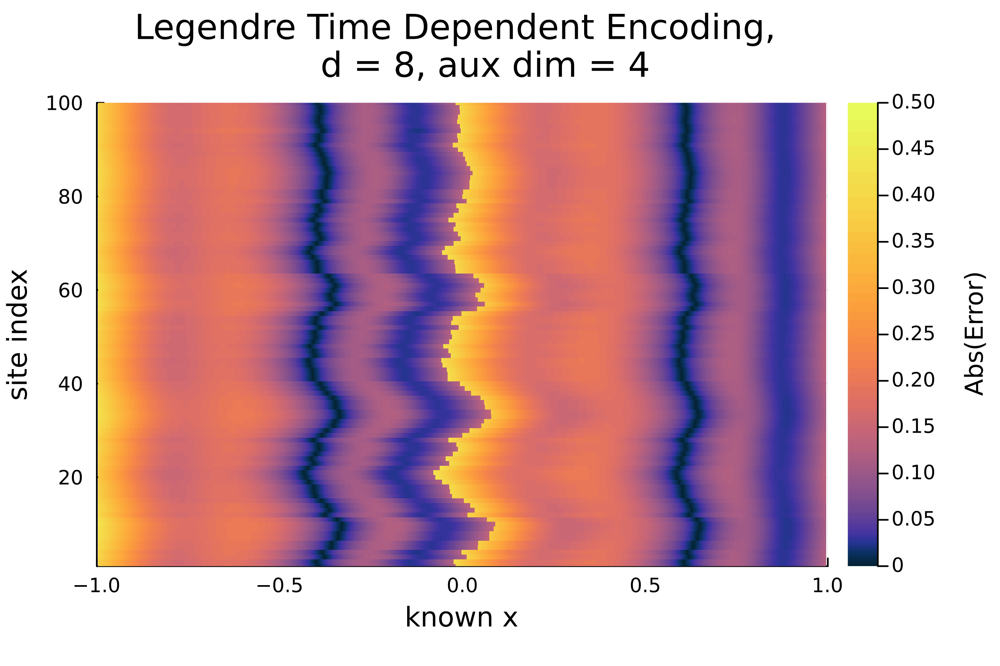

In [301]:
heatmap(xvals, sites, errors_all_lgd_8_4_td, title="Legendre Time Dependent Encoding, 
    d = 8, aux dim = 4", bottom_margin=5mm, top_margin=5mm, right_margin=5mm,
    xlabel="known x", ylabel="site index", colorbar_title="\nAbs(Error)",
    c=custom_cmap, xlims=(-1, 1), ylims=(1,100), dpi=420, clim=(0, 0.5))
#savefig("encoding_uncertainty_plots/legendre_d8_aux4_encoding_uncertainty.svg")

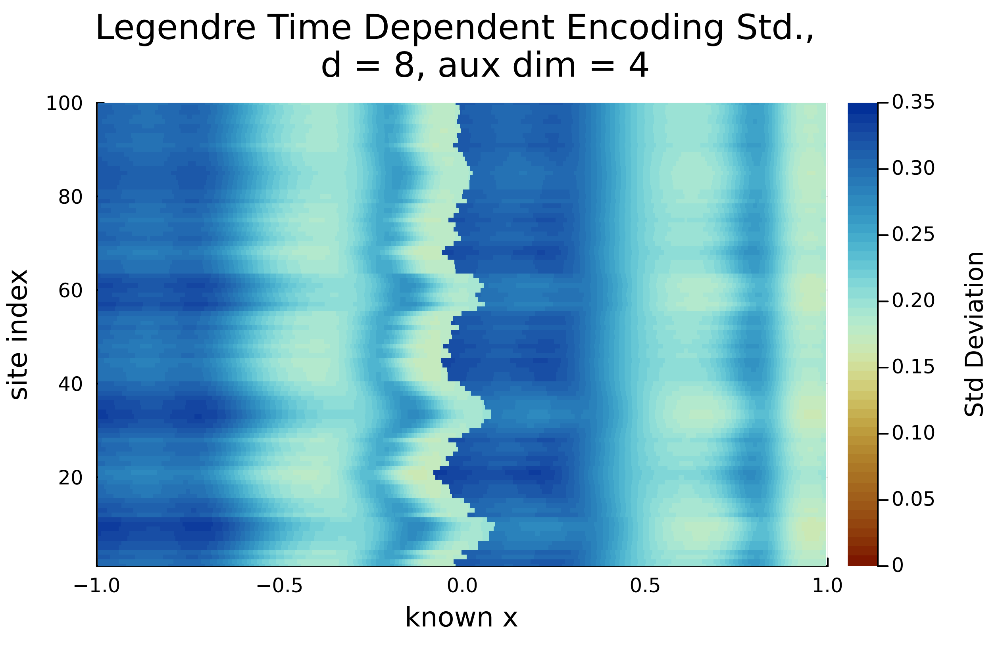

In [304]:
heatmap(xvals, sites, stds_all_lgd_8_4_td, title="Legendre Time Dependent Encoding Std., 
    d = 8, aux dim = 4", bottom_margin=5mm, top_margin=5mm, right_margin=5mm,
    xlabel="known x", ylabel="site index", colorbar_title="\nStd Deviation", c=custom_cmap_std, xlims=(-1, 1), 
    ylims=(1, 100), dpi=420, clims=(0.0, 0.35))
#savefig("encoding_uncertainty_plots/legendre_d8_aux4_encoding_uncertainty_std.svg")

In [184]:
sitewise_mean_error_over_domain_lgd_12_6 = mean(errors_all_lgd_12_6_td, dims=2);
sitewise_mean_std_over_domain_lgd_12_6 = mean(stds_all_lgd_12_6_td, dims=2);

sitewise_mean_error_over_domain_lgd_10_5 = mean(errors_all_lgd_10_5_td, dims=2);
sitewise_mean_std_over_domain_lgd_10_5 = mean(stds_all_lgd_10_5_td, dims=2);

sitewise_mean_error_over_domain_lgd_8_4 = mean(errors_all_lgd_8_4_td, dims=2);
sitewise_mean_std_over_domain_lgd_8_4 = mean(stds_all_lgd_8_4_td, dims=2);

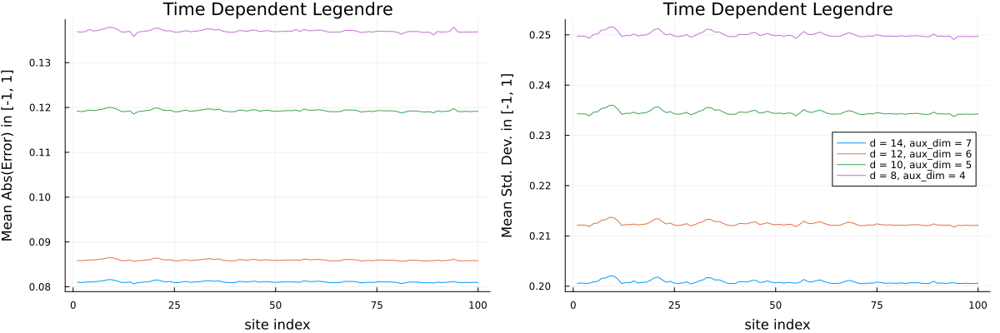

In [200]:
p1 = plot(sites, sitewise_mean_error_over_domain_lgd, label="d = 14, aux_dim = 7", 
    xlabel="site index", ylabel="Mean Abs(Error) in [-1, 1]", title="Time Dependent Legendre", legend=false)
p1 = plot!(sites, sitewise_mean_error_over_domain_lgd_12_6, label="d = 12, aux_dim = 6")
p1 = plot!(sites, sitewise_mean_error_over_domain_lgd_10_5, label="d = 10, aux_dim = 5")
p1 = plot!(sites, sitewise_mean_error_over_domain_lgd_8_4, label="d = 10, aux_dim = 5")

p2 = plot(sites, sitewise_mean_std_over_domain_lgd, label="d = 14, aux_dim = 7", xlabel="site index",
    ylabel="Mean Std. Dev. in [-1, 1]", legend=:right, title="Time Dependent Legendre")
p2 = plot!(sites, sitewise_mean_std_over_domain_lgd_12_6, label ="d = 12, aux_dim = 6")
p2 = plot!(sites, sitewise_mean_std_over_domain_lgd_10_5, label ="d = 10, aux_dim = 5")
p2 = plot!(sites, sitewise_mean_std_over_domain_lgd_8_4, label ="d = 8, aux_dim = 4")

plot(p1, p2, size=(1200, 400), left_margin=5mm, bottom_margin=5mm)
#savefig("encoding_uncertainty_plots/time_dep_legendre_mean_compare.svg")

In [238]:
cpal = palette(:tab10)

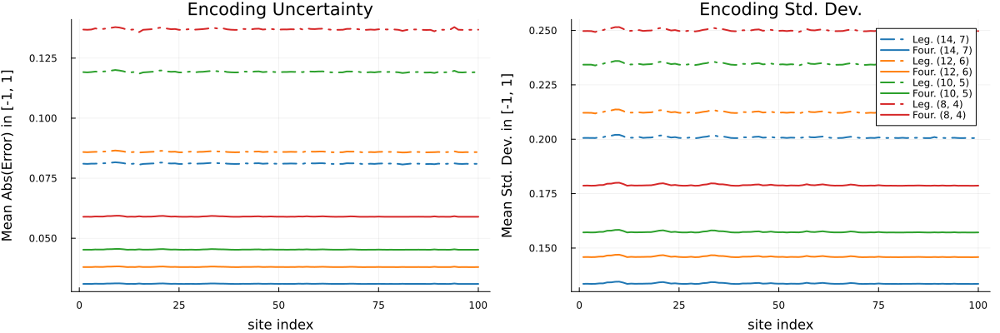

In [263]:
p1 = plot(sites, sitewise_mean_error_over_domain_lgd, label="Leg. (14, 7)", title="Encoding Uncertainty", 
    xlabel="site index", ylabel="Mean Abs(Error) in [-1, 1]", ls=:dashdot, lw=2, c=cpal[1], legend=false)
p1 = plot!(sites, sitewise_mean_error_over_domain_fr, label="Four. (14, 7)", lw=2, c=cpal[1])

p1 = plot!(sites, sitewise_mean_error_over_domain_lgd_12_6, label="Leg. (12, 6)", c=cpal[2], 
    ls=:dashdot, lw=2)
p1 = plot!(sites, sitewise_mean_error_over_domain_fr12_6, label="Four. (12, 6)", c=cpal[2], 
    lw=2)

p1 = plot!(sites, sitewise_mean_error_over_domain_lgd_10_5, label="Leg. (10, 5)", c=cpal[3], 
    ls=:dashdot, lw=2)
p1 = plot!(sites, sitewise_mean_error_over_domain_fr10_5, label="Four. (10, 5)", c=cpal[3], 
    lw=2)

p1 = plot!(sites, sitewise_mean_error_over_domain_lgd_8_4, label="Leg. (8, 4)", c=cpal[4], 
    ls=:dashdot, lw=2)
p1 = plot!(sites, sitewise_mean_error_over_domain_fr8_4, label="Four. (8, 4)", c=cpal[4], 
    lw=2)

p2 = plot(sites, sitewise_mean_std_over_domain_lgd, label="Leg. (14, 7)", title="Encoding Std. Dev.",
    xlabel="site index", ylabel="Mean Std. Dev. in [-1, 1]", ls=:dashdot, lw=2, c=cpal[1])
p2 = plot!(sites, sitewise_mean_std_over_domain_fr, label="Four. (14, 7)", lw=2, c=cpal[1])

p2 = plot!(sites, sitewise_mean_std_over_domain_lgd_12_6, label="Leg. (12, 6)", c=cpal[2], 
    ls=:dashdot, lw=2)
p2 = plot!(sites, sitewise_mean_std_over_domain_fr12_6, label="Four. (12, 6)", c=cpal[2], 
    lw=2)

p2 = plot!(sites, sitewise_mean_std_over_domain_lgd_10_5, label="Leg. (10, 5)", c=cpal[3], 
    ls=:dashdot, lw=2)
p2 = plot!(sites, sitewise_mean_std_over_domain_fr10_5, label="Four. (10, 5)", c=cpal[3], 
    lw=2)

p2 = plot!(sites, sitewise_mean_std_over_domain_lgd_8_4, label="Leg. (8, 4)", c=cpal[4], 
    ls=:dashdot, lw=2)
p2 = plot!(sites, sitewise_mean_std_over_domain_fr8_4, label="Four. (8, 4)", c=cpal[4], 
    lw=2)
plot(p1, p2, size=(1200, 400), bottom_margin=5mm, left_margin=5mm)
#savefig("encoding_uncertainty_plots/time_dep_legfour_mean_compare.svg")

### Stoudenmire

In [308]:
loaded_f = jldopen("/Users/joshua/QuantumMay/histsplit_stoudenmire_d8_aux2_chi40.jld2")
opts = read(loaded_f, "opts");
X_train_scaled = read(loaded_f, "X_train_scaled");
y_train = read(loaded_f, "y_train");
enc_args = get_enc_args_from_opts(opts, X_train_scaled, y_train);

Re-encoding the training data to get the encoding arguments...


In [309]:
sites = collect(1:1:100);
num_evals = 1000;
errors_all_stoud_8_2_td = Matrix{Float64}(undef, length(sites), num_evals);
stds_all_stoud_8_2_td = Matrix{Float64}(undef, length(sites), num_evals);
xvals = collect(LinRange((0.0), (1.0), num_evals));
for (i, s) in enumerate(sites)
    println("Computing site: $s")
    _, abs_diffs, stds = get_encoding_uncertainty(opts, enc_args, s, xvals);
    errors_all_stoud_8_2_td[i, :] = abs_diffs
    stds_all_stoud_8_2_td[i, :] = stds
end

Computing site: 1
Computing site: 2
Computing site: 3
Computing site: 4
Computing site: 5
Computing site: 6
Computing site: 7
Computing site: 8
Computing site: 9
Computing site: 10
Computing site: 11
Computing site: 12
Computing site: 13
Computing site: 14
Computing site: 15
Computing site: 16
Computing site: 17
Computing site: 18
Computing site: 19
Computing site: 20
Computing site: 21
Computing site: 22
Computing site: 23
Computing site: 24
Computing site: 25
Computing site: 26
Computing site: 27
Computing site: 28
Computing site: 29
Computing site: 30
Computing site: 31
Computing site: 32
Computing site: 33
Computing site: 34
Computing site: 35
Computing site: 36
Computing site: 37
Computing site: 38
Computing site: 39
Computing site: 40
Computing site: 41
Computing site: 42
Computing site: 43
Computing site: 44
Computing site: 45
Computing site: 46
Computing site: 47
Computing site: 48
Computing site: 49
Computing site: 50
Computing site: 51
Computing site: 52
Computing site: 53
Co

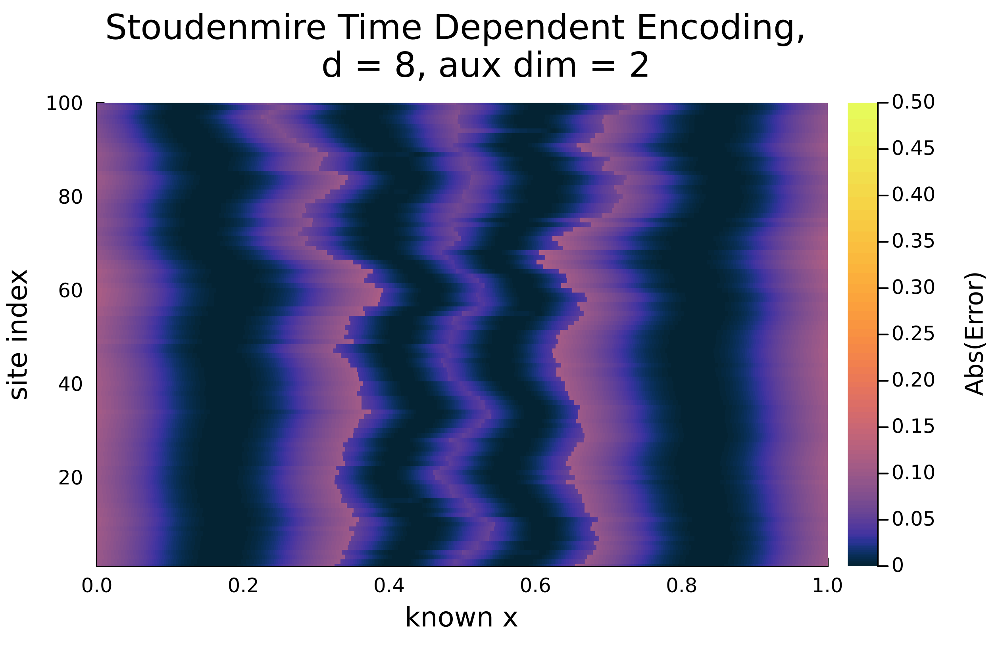

In [320]:
heatmap(xvals, sites, errors_all_stoud_8_2_td, title="Stoudenmire Time Dependent Encoding, 
    d = 8, aux dim = 2", bottom_margin=5mm, top_margin=5mm, right_margin=5mm,
    xlabel="known x", ylabel="site index", colorbar_title="\nAbs(Error)",
    c=custom_cmap, xlims=(0, 1), ylims=(1,100), dpi=420, clim=(0, 0.5))

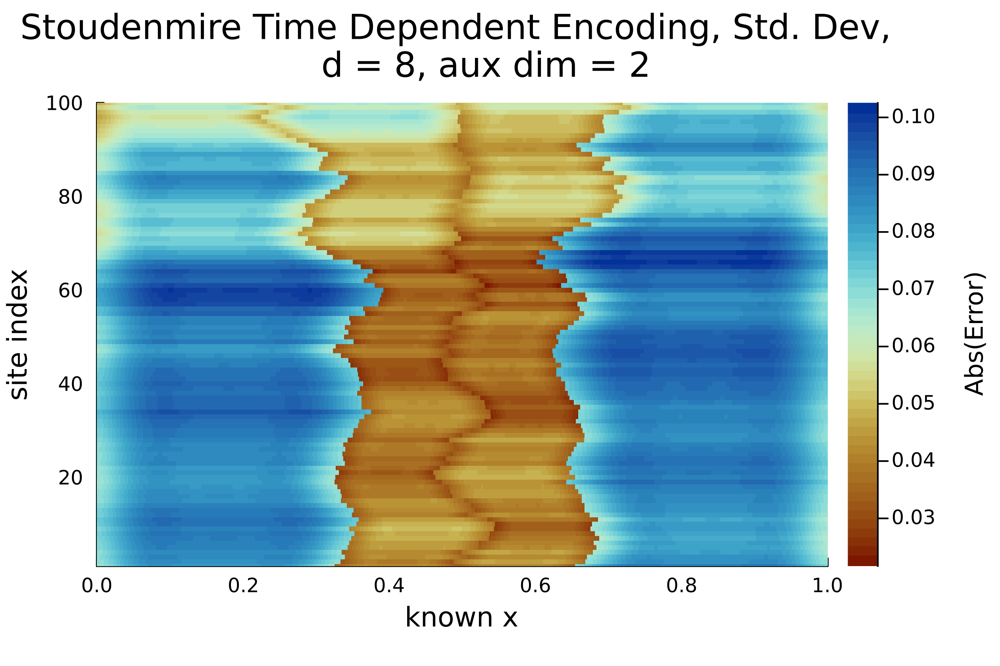

In [321]:
heatmap(xvals, sites, stds_all_stoud_8_2_td, title="Stoudenmire Time Dependent Encoding, Std. Dev, 
    d = 8, aux dim = 2", bottom_margin=5mm, top_margin=5mm, right_margin=5mm,
    xlabel="known x", ylabel="site index", colorbar_title="\nAbs(Error)",
    c=custom_cmap_std, xlims=(0, 1), ylims=(1,100), dpi=420)

In [322]:
sitewise_mean_error_over_domain_stoud_8_2 = mean(errors_all_stoud_8_2_td, dims=2)
sitewise_mean_std_over_domain_stoud_8_2 = mean(stds_all_stoud_8_2_td, dims=2)

100×1 Matrix{Float64}:
 0.06850913916598372
 0.06806236394494607
 0.06824182814829553
 0.06743105726805855
 0.06763939847912173
 0.06812034709465796
 0.06792118743131868
 0.06875780470431517
 0.06894498465175462
 0.06959454598889608
 ⋮
 0.06414919689214821
 0.06346331360083537
 0.06293167450907827
 0.06281166505047908
 0.06289851128957048
 0.06297669148671756
 0.0619603928161528
 0.06146908378244513
 0.06171850350784596

In [323]:
loaded_f = jldopen("/Users/joshua/QuantumMay/histsplit_stoudenmire_d10_aux2_chi40.jld2")
opts = read(loaded_f, "opts");
X_train_scaled = read(loaded_f, "X_train_scaled");
y_train = read(loaded_f, "y_train");
enc_args = get_enc_args_from_opts(opts, X_train_scaled, y_train);

Re-encoding the training data to get the encoding arguments...


In [324]:
sites = collect(1:1:100);
num_evals = 1000;
errors_all_stoud_10_2_td = Matrix{Float64}(undef, length(sites), num_evals);
stds_all_stoud_10_2_td = Matrix{Float64}(undef, length(sites), num_evals);
xvals = collect(LinRange((0.0), (1.0), num_evals));
for (i, s) in enumerate(sites)
    println("Computing site: $s")
    _, abs_diffs, stds = get_encoding_uncertainty(opts, enc_args, s, xvals);
    errors_all_stoud_10_2_td[i, :] = abs_diffs
    stds_all_stoud_10_2_td[i, :] = stds
end

Computing site: 1
Computing site: 2
Computing site: 3
Computing site: 4
Computing site: 5
Computing site: 6
Computing site: 7
Computing site: 8
Computing site: 9
Computing site: 10
Computing site: 11
Computing site: 12
Computing site: 13
Computing site: 14
Computing site: 15
Computing site: 16
Computing site: 17
Computing site: 18
Computing site: 19
Computing site: 20
Computing site: 21
Computing site: 22
Computing site: 23
Computing site: 24
Computing site: 25
Computing site: 26
Computing site: 27
Computing site: 28
Computing site: 29
Computing site: 30
Computing site: 31
Computing site: 32
Computing site: 33
Computing site: 34
Computing site: 35
Computing site: 36
Computing site: 37
Computing site: 38
Computing site: 39
Computing site: 40
Computing site: 41
Computing site: 42
Computing site: 43
Computing site: 44
Computing site: 45
Computing site: 46
Computing site: 47
Computing site: 48
Computing site: 49
Computing site: 50
Computing site: 51
Computing site: 52
Computing site: 53
Co

In [330]:
mean(errors_all_stoud_10_2_td, dims=2)

100×1 Matrix{Float64}:
   0.025955635103908394
   0.026287503532894628
   0.026257609315265183
   0.025955593961132086
   0.026341381898962284
   0.026137926870231643
 NaN
   0.026369175429291628
 NaN
 NaN
   ⋮
   0.024341575132247346
   0.023912315519873467
   0.024405985426251293
   0.024224037332347736
   0.023928366483829976
   0.023250393897218977
   0.022665919224706715
   0.02298045011803865
   0.022386091166521162

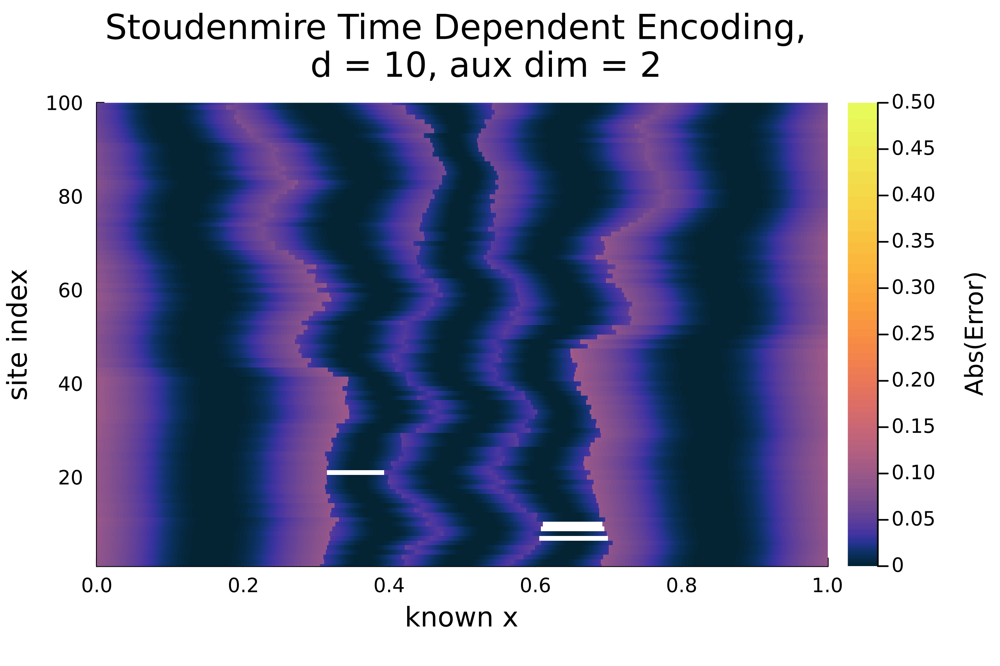

In [327]:
heatmap(xvals, sites, errors_all_stoud_10_2_td, title="Stoudenmire Time Dependent Encoding, 
    d = 10, aux dim = 2", bottom_margin=5mm, top_margin=5mm, right_margin=5mm,
    xlabel="known x", ylabel="site index", colorbar_title="\nAbs(Error)",
    c=custom_cmap, xlims=(0, 1), ylims=(1,100), dpi=420, clim=(0, 0.5))

White regions correspond to NaNs

In [348]:
_, abs_diffs, stds = get_encoding_uncertainty(opts, enc_args, 7, xvals);

In [350]:
println(abs_diffs)

[0.09479067578553683, 0.09391788470726521, 0.0930510376035484, 0.09218979024972232, 0.09133380551655515, 0.09048274194690017, 0.08963626232831955, 0.08879403157399886, 0.08795571614069046, 0.08712098808969464, 0.08628952197690012, 0.08546099732066231, 0.08463509933870095, 0.0838115172418776, 0.08298994798089364, 0.08217009470833692, 0.08135166725093194, 0.08053438463306029, 0.07971797260842813, 0.07890216602784911, 0.07808670882945248, 0.07727135447404686, 0.07645586636437002, 0.07564001735582013, 0.07482359362775438, 0.07400638993849906, 0.07318821330579071, 0.07236888252128333, 0.07154822845997233, 0.0707260943693918, 0.06990233613811833, 0.06907682254314595, 0.06824943547573205, 0.0674200701453454, 0.06658863437490467, 0.06575505225193656, 0.06491925910632781, 0.06408120501100717, 0.06324085403796827, 0.0623981843250755, 0.06155318811938916, 0.060705871796928594, 0.05985625585883019, 0.059004374903893764, 0.058150277577547475, 0.057294025592274825, 0.05643569720847219, 0.05557538180

In [351]:
findall(x -> x .== NaN, abs_diffs)

Int64[]

Forecasting performance comparison

In [354]:
loaded_data = jldopen("/Users/joshua/QuantumMay/forecasting_histplit_results.jld2")

JLDFile /Users/joshua/QuantumMay/forecasting_histplit_results.jld2 (read-only)
 ├─🔢 legendre_d8_aux4_perf
 ├─🔢 fourier_d8_aux4_perf
 ├─🔢 legendre_d10_aux5_perf
 ├─🔢 fourier_d10_aux5_perf
 ├─🔢 fourier_d12_aux6_perf
 ├─🔢 legendre_d12_aux6_perf
 ├─🔢 fourier_d14_aux7_perf
 └─🔢 legendre_d14_aux7_perf

In [361]:
leg_14_7_f = read(loaded_data, "legendre_d14_aux7_perf")
four_14_7_f = read(loaded_data, "fourier_d14_aux7_perf")
leg_12_6_f = read(loaded_data, "legendre_d12_aux6_perf")
four_12_6_f = read(loaded_data, "fourier_d12_aux6_perf")
leg_10_5_f = read(loaded_data, "legendre_d10_aux5_perf")
four_10_5_f = read(loaded_data, "fourier_d10_aux5_perf")
leg_8_4_f = read(loaded_data, "legendre_d8_aux4_perf")
four_8_4_f = read(loaded_data, "fourier_d8_aux4_perf")

leg_14_7 = vcat([x[:MSE] for x in leg_14_7_f[1]], [x[:MSE] for x in leg_14_7_f[2]])
four_14_7 = vcat([x[:MSE] for x in four_14_7_f[1]], [x[:MSE] for x in four_14_7_f[2]])
leg_12_6 = vcat([x[:MSE] for x in leg_12_6_f[1]], [x[:MSE] for x in leg_12_6_f[2]])
four_12_6 = vcat([x[:MSE] for x in four_12_6_f[1]], [x[:MSE] for x in four_12_6_f[2]])
leg_10_5 = vcat([x[:MSE] for x in leg_10_5_f[1]], [x[:MSE] for x in leg_10_5_f[2]])
four_10_5 = vcat([x[:MSE] for x in four_10_5_f[1]], [x[:MSE] for x in four_10_5_f[2]])
leg_8_4 = vcat([x[:MSE] for x in leg_8_4_f[1]], [x[:MSE] for x in leg_8_4_f[2]])
four_8_4 = vcat([x[:MSE] for x in four_8_4_f[1]], [x[:MSE] for x in four_8_4_f[2]])

100-element Vector{Float64}:
 0.004522575647301072
 0.005836505506681037
 0.0058068975224301374
 0.011318713437706518
 0.005628517301428982
 0.0066315798809216085
 0.005257291295912201
 0.00640902627286179
 0.005006258857417551
 0.004839619646536248
 ⋮
 0.0037255871176438238
 0.005839217937523463
 0.004422223175550084
 0.0054993570936569865
 0.00399401250251663
 0.007761493388996485
 0.006017215583269541
 0.004770061899195897
 0.009847490529975595

In [365]:
using DataFrames

In [366]:
df = DataFrame(
    MSE = vcat(
        leg_14_7, four_14_7,
        leg_12_6, four_12_6,
        leg_10_5, four_10_5,
        leg_8_4, four_8_4
    ),
    Class = vcat(
        fill("Legendre", length(leg_14_7)), fill("Fourier", length(four_14_7)),
        fill("Legendre", length(leg_12_6)), fill("Fourier", length(four_12_6)),
        fill("Legendre", length(leg_10_5)), fill("Fourier", length(four_10_5)),
        fill("Legendre", length(leg_8_4)), fill("Fourier", length(four_8_4))
    ),
    Parameters = vcat(
        fill("(14,7)", length(leg_14_7)), fill("(14,7)", length(four_14_7)),
        fill("(12,6)", length(leg_12_6)), fill("(12,6)", length(four_12_6)),
        fill("(10,5)", length(leg_10_5)), fill("(10,5)", length(four_10_5)),
        fill("(8,4)", length(leg_8_4)), fill("(8,4)", length(four_8_4))
    )
)

Row,MSE,Class,Parameters
,Float64,String,String
1,0.0133997,Legendre,"(14,7)"
2,0.00812463,Legendre,"(14,7)"
3,0.0119891,Legendre,"(14,7)"
4,0.0143981,Legendre,"(14,7)"
5,0.0109664,Legendre,"(14,7)"
6,0.0133871,Legendre,"(14,7)"
7,0.00822871,Legendre,"(14,7)"
8,0.0126964,Legendre,"(14,7)"
9,0.012471,Legendre,"(14,7)"


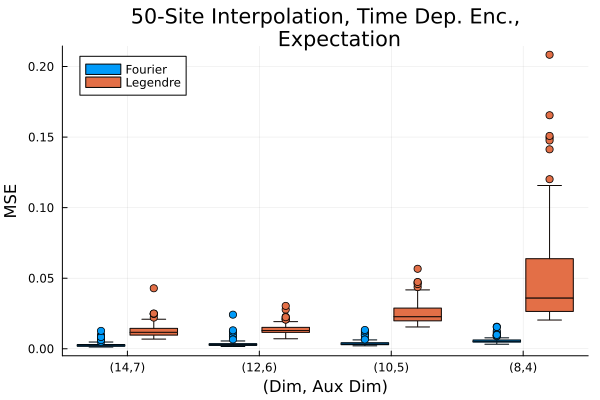

In [391]:
@df df groupedboxplot(:Parameters, :MSE, group = :Class, legend = :topleft, 
    xlabel="(Dim, Aux Dim)", ylabel="MSE", title="50-Site Imputation, Time Dep. Enc.,
    Expectation")
#savefig("time_dep_interp_compare.svg")